# Use spectra of CTIO Data in June 2017 to do atmospheric studies
==================================================================================================
## Look at equivalent width

- author : Sylvie Dagoret-Campagne
- date   : June 13th 2017

This notebook is supposed to perform an atmospheric properties measurement on spectra

In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
print theNotebook

AnaEqWdtCalibSpectrum


In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os
import pandas as pd

In [6]:
from matplotlib.backends.backend_pdf import PdfPages

In [7]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [8]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal
from scipy.interpolate import interp1d

In [9]:
from scipy.optimize import curve_fit

In [10]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [11]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [12]:
import sys
sys.path.append("../../common_tools/")
from holo_specs import *

In [13]:
%load_ext Cython

In [14]:
from IPython.display import Image, display

In [15]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [16]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (10, 10),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [17]:
%config InlineBackend.rc = {}
matplotlib.rc_file("../../templates/matplotlibrc")

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/__init__.py:913: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [18]:
from scipy.interpolate import interp1d

In [19]:
import datetime
from dateutil import parser  # very usefull time format smart parser

In [20]:
from matplotlib.dates import MonthLocator, WeekdayLocator,DateFormatter
from matplotlib.dates import MONDAY

In [21]:
mondays = WeekdayLocator(MONDAY)
months = MonthLocator(range(1, 13), bymonthday=1, interval=1)
monthsFmt = DateFormatter("%b '%y")

In [22]:
import matplotlib.dates as mdates

years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
days=mdates.DayLocator()  # every day
hour=mdates.HourLocator()  # every day
yearsFmt = mdates.DateFormatter('%Y')

In [23]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [24]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

## Config

In [25]:
inputdir="./spectrum_calibspec"
MIN_IMGNUMBER=74
MAX_IMGNUMBER=108
object_name='HD111980 May 31th 2017'
object_name_sim='HD111980_May_31th'
SelectTagRe='^calibSpectra_20170531_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^calibSpectra_20170531_[0-9]+.fits$'
NBIMGPERROW=2

### Input sim files

In [26]:
inputsimfitsfile='AllSimSpectra_'+object_name_sim+'.fits'

### Output files

In [27]:
outputdir="./spectrum_eqwana"

In [28]:
ensure_dir(outputdir)

In [29]:
output_file='AnaEqWdtFromSpectra_'+object_name_sim+'.csv'

In [30]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [31]:
ensure_dir(dir_top_images) # create that directory

## Location of calibrated spectra and Simulations
----------------------------------

### Input simulation files

In [32]:
hdu_list=fits.open(inputsimfitsfile)
header=hdu_list[0].header
print header
simspectra_data=hdu_list[0].data

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                 4840                                                  NAXIS2  =                   36                                                  EXTEND  =                    T                                                  END                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [33]:
print simspectra_data.shape

(36, 4840)


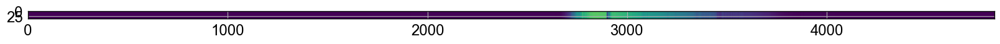

In [34]:
plt.figure(figsize=(20,20))
plt.imshow(simspectra_data[:,:],vmin=0,vmax=1e-12)
plt.xmin=(0.,10000.)

### Make tables

In [35]:
allspectra_sim=simspectra_data[1:,:]
thewl_sim=simspectra_data[0,:]

In [36]:
NBSPECSIM=allspectra_sim.shape[0]

In [37]:
allwl_sim = [thewl_sim for _ in range(NBSPECSIM)]

In [38]:
allwl_sim =np.array(allwl_sim )

In [39]:
allwl_sim=allwl_sim/10.

In [40]:
print NBSPECSIM

35


(0.0, 1000.0)

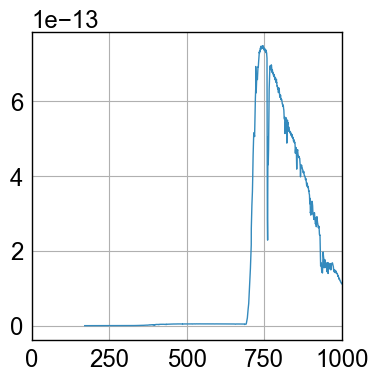

In [41]:
sel=1
plt.plot(allwl_sim[sel],allspectra_sim[sel])
plt.xlim(0.,1000.)

### Input data files

In [42]:
input_filelist=os.listdir(inputdir) 

In [43]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [44]:
print input_filelist[0:5]

['calibSpectra_20170531_074.fits' 'calibSpectra_20170531_075.fits'
 'calibSpectra_20170531_076.fits' 'calibSpectra_20170531_077.fits'
 'calibSpectra_20170531_078.fits']


In [45]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [46]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file 
            
            if re.search('.*fits$',filename):  #example of filename filter
                
                num_str=re.findall(SelectTagRe,file)[0]
               
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)   
                
                
    return indexes_files, filelist_fitsimages

In [47]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # filter to select fits file only

In [48]:
# transform into numpy arrays
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [49]:
print indexes_files

[ 74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91
  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108]


In [50]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [51]:
sorted_numbers=indexes_files[sorted_indexes]

In [52]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34]


In [53]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [54]:
sorted_files[0:5]

array(['./spectrum_calibspec/calibSpectra_20170531_074.fits',
       './spectrum_calibspec/calibSpectra_20170531_075.fits',
       './spectrum_calibspec/calibSpectra_20170531_076.fits',
       './spectrum_calibspec/calibSpectra_20170531_077.fits',
       './spectrum_calibspec/calibSpectra_20170531_078.fits'], 
      dtype='|S51')

## Build full filename
----------------------------

In [55]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [56]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [57]:
print sorted_filenames.shape

(35,)


## Acces to spectrum data
----------------------------------

In [58]:
%%cython

import numpy as np
from astropy.io import fits

def BuildCalibSpec(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawSpec
    ===============
    """

    all_dates = []
    all_airmass = []
    all_leftspectra_data = []
    all_rightspectra_data = []
    all_totleftspectra_data = []
    all_totrightspectra_data = []
    all_leftspectra_data_staterr = []
    all_rightspectra_data_staterr = []
    
    all_leftspectra_wl = []
    all_rightspectra_wl = []
    
    all_titles = []
    all_header = []
    all_expo = []
    all_filt= []
    all_hum = []
    
    all_elecgain = []
    
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        
        #hdu_list.info()
        
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        filters = header['FILTERS'].split(' ')[1]
        hum= float(header['OUTHUM'])
        gain = 0.25*(float(header['GTGAIN11'])+float(header['GTGAIN12'])+float(header['GTGAIN21'])+float(header['GTGAIN22']))
        
        # now reads the spectra
        
        table_data=hdu_list[1].data
        
        if idx==0:
            cols = hdu_list[1].columns
            cols.info()
            print hdu_list[1].columns
            cols.names
     
    
        left_spectrum_wl=table_data.field('CalibLeftSpecWL')
        left_spectrum_data=table_data.field('CalibLeftSpec')
        left_totspectrum_data=table_data.field('CalibTotLeftSpec')
        left_spectrum_data_staterr=table_data.field('CalibStatErrorLeftSpec')
        
        right_spectrum_wl=table_data.field('CalibRightSpecWL')
        right_spectrum_data=table_data.field('CalibRightSpec')
        right_totspectrum_data=table_data.field('CalibTotRightSpec')
        right_spectrum_data_staterr=table_data.field('CalibStatErrorRightSpec')
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        
        all_leftspectra_data.append(left_spectrum_data)
        all_rightspectra_data.append(right_spectrum_data)
        
        all_totleftspectra_data.append(left_totspectrum_data)
        all_totrightspectra_data.append(right_totspectrum_data)
        
        all_leftspectra_data_staterr.append(left_spectrum_data_staterr)
        all_rightspectra_data_staterr.append(right_spectrum_data_staterr)
        
        all_leftspectra_wl.append(left_spectrum_wl)
        all_rightspectra_wl.append(right_spectrum_wl)
        
       
        
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        
        all_filt.append(filters)
        all_hum.append(hum)
        all_elecgain.append(gain)
        
            
        hdu_list.close()
        
        
        
        
    return all_dates,all_airmass,all_titles,all_header,all_expo, all_leftspectra_data,all_rightspectra_data,all_totleftspectra_data,all_totrightspectra_data, all_leftspectra_data_staterr,all_rightspectra_data_staterr,all_leftspectra_wl,all_rightspectra_wl,all_filt,all_hum,all_elecgain

In [59]:
all_dates,all_airmass,all_titles,all_header,all_expo,all_leftspectra_data,all_rightspectra_data,all_totleftspectra_data,all_totrightspectra_data,all_leftspectra_data_staterr,all_rightspectra_data_staterr,all_leftspectra_wl,all_rightspectra_wl,all_filt,all_hum,all_gainelec=BuildCalibSpec(sorted_files,sorted_numbers,object_name)

name:
    ['CalibLeftSpecWL', 'CalibLeftSpec', 'CalibTotLeftSpec', 'CalibRightSpecWL', 'CalibRightSpec', 'CalibTotRightSpec', 'CalibStatErrorLeftSpec', 'CalibStatErrorRightSpec']
format:
    ['E', 'E', 'E', 'E', 'E', 'E', 'E', 'E']
unit:
    ['', '', '', '', '', '', '', '']
null:
    ['', '', '', '', '', '', '', '']
bscale:
    ['', '', '', '', '', '', '', '']
bzero:
    ['', '', '', '', '', '', '', '']
disp:
    ['', '', '', '', '', '', '', '']
start:
    ['', '', '', '', '', '', '', '']
dim:
    ['', '', '', '', '', '', '', '']
ColDefs(
    name = 'CalibLeftSpecWL'; format = 'E'
    name = 'CalibLeftSpec'; format = 'E'
    name = 'CalibTotLeftSpec'; format = 'E'
    name = 'CalibRightSpecWL'; format = 'E'
    name = 'CalibRightSpec'; format = 'E'
    name = 'CalibTotRightSpec'; format = 'E'
    name = 'CalibStatErrorLeftSpec'; format = 'E'
    name = 'CalibStatErrorRightSpec'; format = 'E'
)


In [60]:
NDATA=len(all_dates)

In [61]:
print NDATA

35


In [62]:
all_dt=all_dates

In [63]:
Thor300_index=np.where(np.array(all_filt) == 'Thor300')[0]
Ron400_index=np.where(np.array(all_filt) == 'Ron400')[0]
HoloPhP_index=np.where(np.array(all_filt) == 'HoloPhP')[0]
HoloPhAg_index=np.where(np.array(all_filt) == 'HoloPhAg')[0]
HoloAmAg_index=np.where(np.array(all_filt) == 'HoloAmAg')[0]

In [64]:
print Thor300_index
print Ron400_index
print HoloPhP_index
print HoloPhAg_index
print HoloAmAg_index

[ 1  6 11 16 21 26 31]
[ 0  5 10 15 20 25 30]
[ 2  7 12 17 22 27 32]
[ 3  8 13 18 23 28 33]
[ 4  9 14 19 24 29 34]


## Airmasses

In [65]:
NDATA=len(all_rightspectra_data)
all_dt= [ parser.parse(all_dates[i]) for i in range(NDATA)]

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs [u'lw', u'linewidth'] which are all aliases for u'linewidth'.  Kept value from u'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


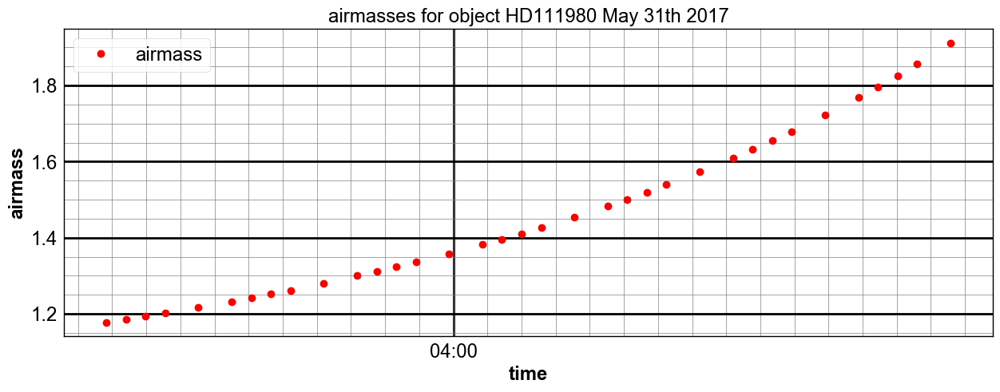

In [66]:
fig=plt.figure(figsize=(15,5))

ax=fig.add_subplot(1,1,1)
ax.plot_date(all_dt, all_airmass,marker='o',color='red',lw=0,label='airmass',linewidth=3)
#ax.plot_date(all_dt, am,marker='.',color='blue',lw=0,label='relative airmass',linewidth=3)

#ax.set_ylim(0.,2)

date_range = all_dt[NDATA-1] - all_dt[0]

if date_range > datetime.timedelta(days = 1):
    ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=range(1,32), interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax.get_xaxis().set_minor_locator(mdates.HourLocator(byhour=range(0,24,2)))
    #ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
else:
    ax.xaxis.set_major_locator(mdates.HourLocator(byhour=range(0,24,2)))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    #ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_xaxis().set_minor_locator(mdates.MinuteLocator(byminute=range(0,60,5)))
    
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='grey', linewidth=0.5)
ax.set_ylabel('airmass')
ax.set_xlabel('time')


title='airmasses for object {}'.format(object_name)

plt.title(title)
plt.legend(loc='best')

figfilename=os.path.join(dir_top_images,'airmass_vs_time.pdf')
fig.savefig(figfilename)

## Dispersers

In [67]:
ListOfDisperserNames=['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg']

## Show Spectra
-----------------------

In [68]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math as m
import os

from matplotlib.backends.backend_pdf import PdfPages
    
def ShowSpectrawithBG(all_spectra,all_totspectra,all_wl,all_titles,object_name,all_filt,dir_top_img):
    """
    ShowSpectra: Show the raw images without background subtraction
    ==============
    """
    NBSPEC=len(all_spectra)
    NBIMGPERROW=2
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    #MAXIMGROW=int(MAXIMGROW)
        
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'intput_calibrated_spectra_withBG.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Calibrated spectra for {}'.format(object_name)
         
    thex0 = []  # container of central position   
        
    
    for index in np.arange(0,NBSPEC):
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20,fontweight='bold')
            
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        spectrum=all_spectra[index]
        spectrum2=all_totspectra[index]
       
        wl=all_wl[index]
        axarr[iy,ix].plot(wl,spectrum,'r-',lw=2,label='data')
        axarr[iy,ix].plot(wl,spectrum2,'k:',lw=2,label='data with BG')
        
        
        max_y_to_plot=spectrum[:].max()*1.2
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
       
        axarr[iy,ix].set_title(all_titles[index])
        #axarr[iy,ix].set_title(all_filt[index])
        axarr[iy,ix].set_xlabel("wavelength (nm)")
        
        axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='k', linewidth=2.0)
        axarr[iy,ix].grid(b=True, which='minor', color='grey', linewidth=0.5)
      
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    

In [69]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math as m
import os

from matplotlib.backends.backend_pdf import PdfPages
 
NormSpecRange= [790,810] # range where to normalize


def ShowSpectra(all_spectra,all_wl,all_titles,object_name,all_filt,dir_top_img,sim_data):
    """
    ShowSpectra: Show the raw images without background subtraction
    ==============
    """
    NBSPEC=len(all_spectra)
    NBIMGPERROW=2
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    #MAXIMGROW=int(MAXIMGROW)
        

    calibdatasimfactor = []    
        
        
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'intput_calibrated_spectra.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Calibrated spectra for {}'.format(object_name)
         
    thex0 = []  # container of central position   
    wl_sim=sim_data[0]/10.
    
    for index in np.arange(0,NBSPEC):
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20,fontweight='bold')
 
  


        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        wl=all_wl[index]  # wavelength in data
        
        spectrum=all_spectra[index]   # data
        
        maxdata_in_range=np.max(spectrum[np.where(np.logical_and(wl>NormSpecRange[0],wl<NormSpecRange[1]))]) # max in data in selected wl range
        
        
        spectrum_sim=sim_data[index+1] # sim
        maxsim_in_range=np.max(spectrum_sim[np.where(np.logical_and(wl_sim>NormSpecRange[0],wl_sim<NormSpecRange[1]))]) # max in sim in selected wl range
        
        calibfactor=maxdata_in_range/maxsim_in_range   # calib factor data/sim in wl range
        
        calibdatasimfactor.append(calibfactor) # for later analysis
        
       
        axarr[iy,ix].plot(wl,spectrum,'r-',lw=2,label='data') # plot data
        
        
        spectrum_sim=spectrum_sim*calibfactor  # renormalize the sim to data units
        
        axarr[iy,ix].plot(wl_sim,spectrum_sim,'b-',lw=2,label='sim')
        
        max_y_to_plot=spectrum[:].max()*1.4
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].set_xlim(0.,1200.)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.4, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
       
        axarr[iy,ix].set_title(all_titles[index])
        #axarr[iy,ix].set_title(all_filt[index])
        axarr[iy,ix].set_xlabel("wavelength (nm)")
        
        axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='k', linewidth=2.0)
        axarr[iy,ix].grid(b=True, which='minor', color='grey', linewidth=0.5)
      
        axarr[iy,ix].legend()
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
            
                
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    return np.array(calibdatasimfactor)
    

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


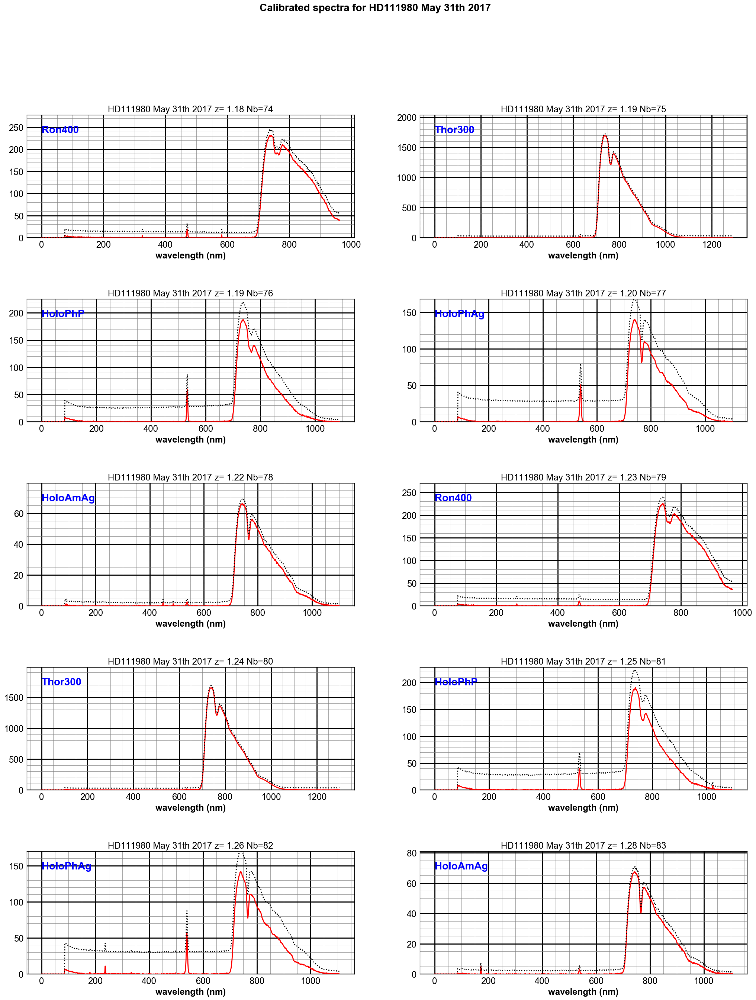

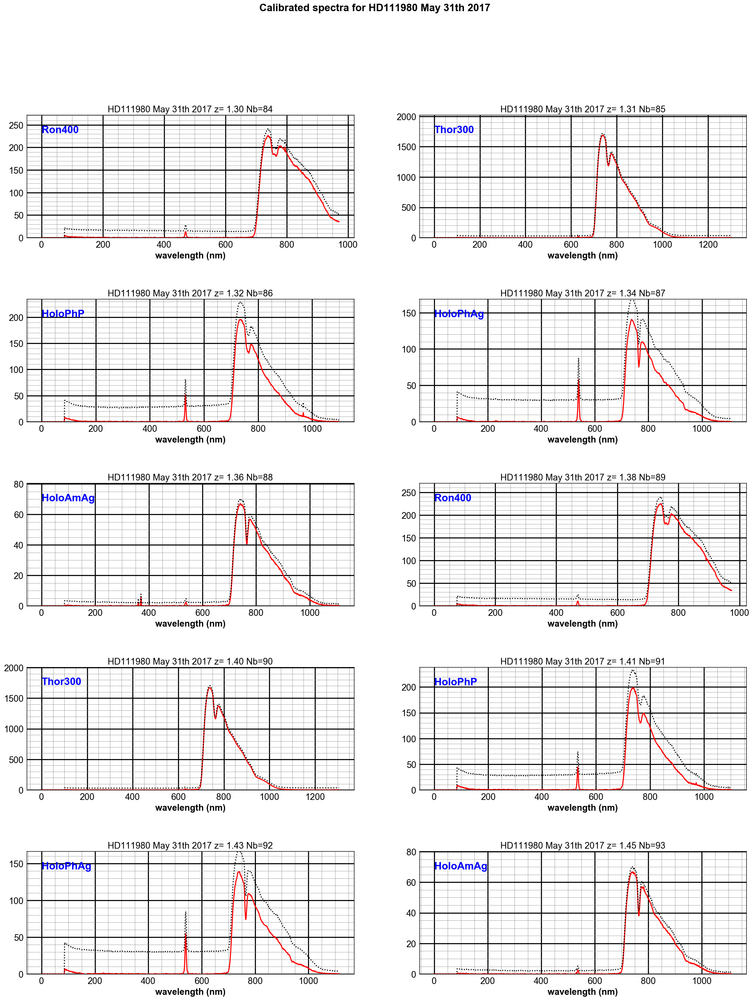

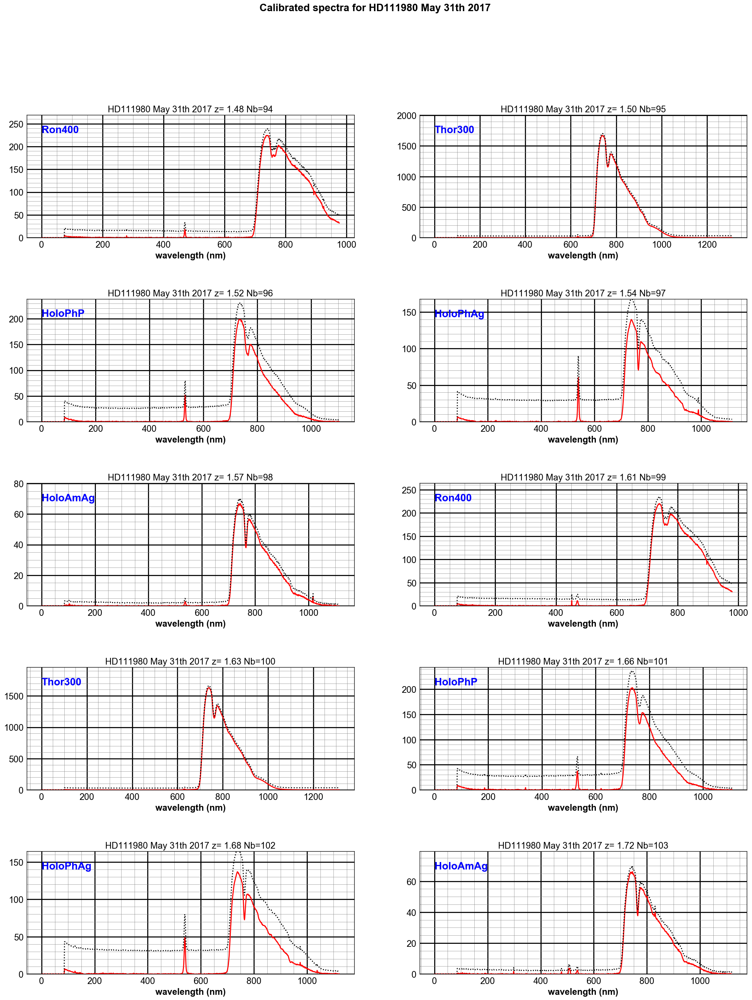

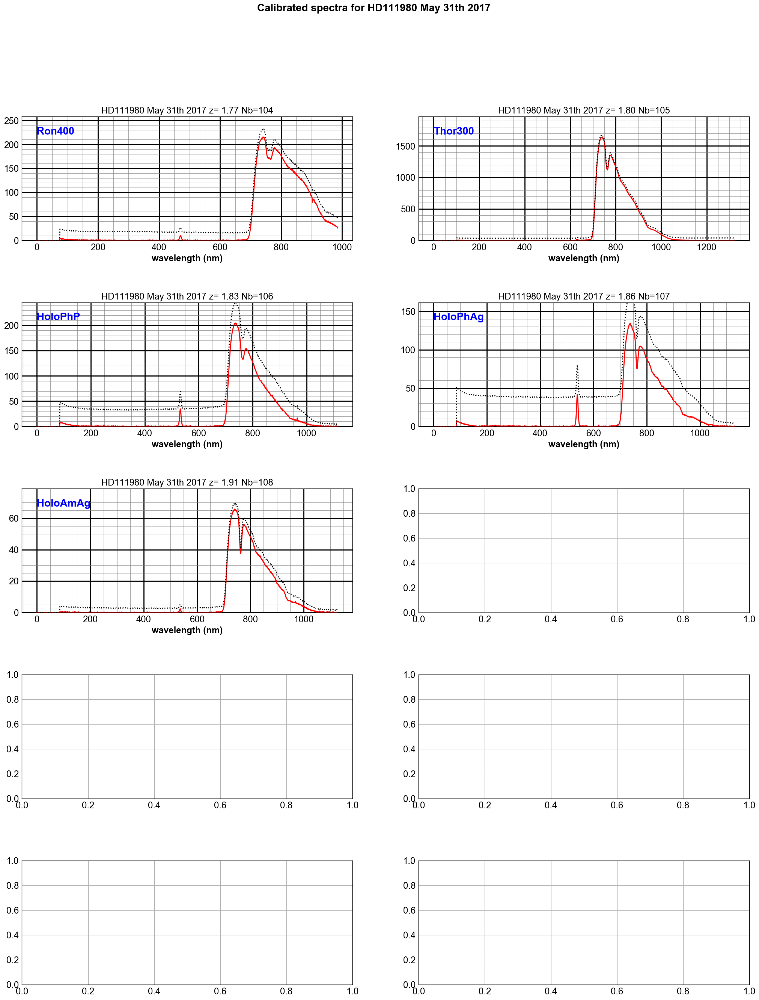

In [70]:
ShowSpectrawithBG(all_rightspectra_data,all_totrightspectra_data,all_rightspectra_wl,all_titles,object_name,all_filt,dir_top_images)

### Work only on right spectra

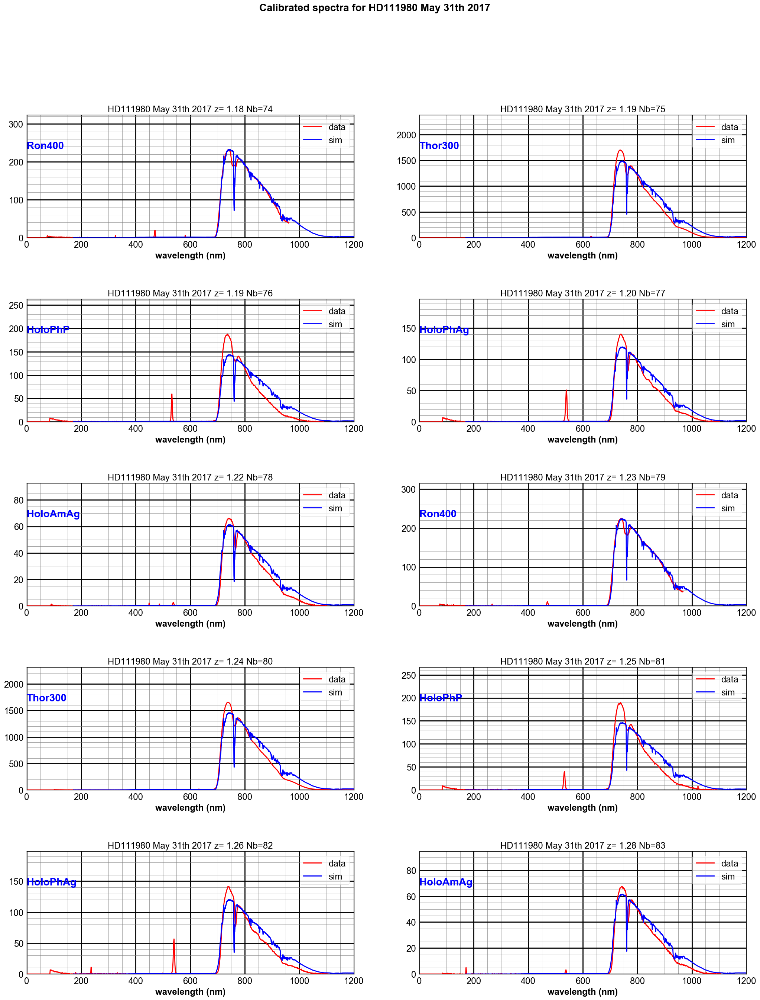

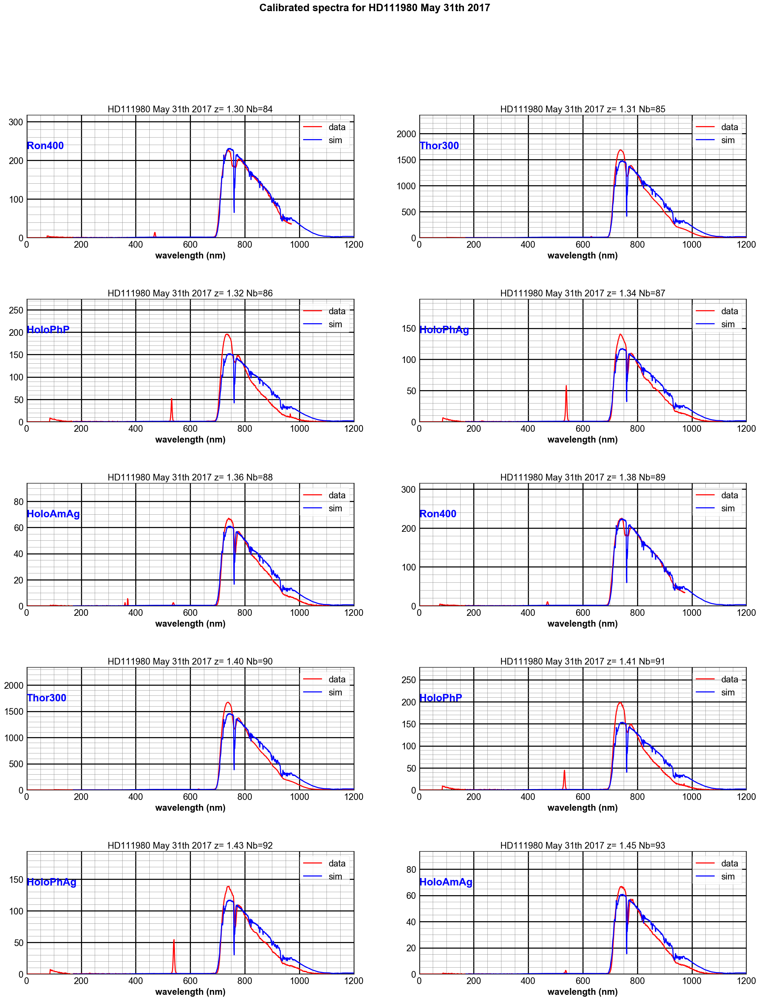

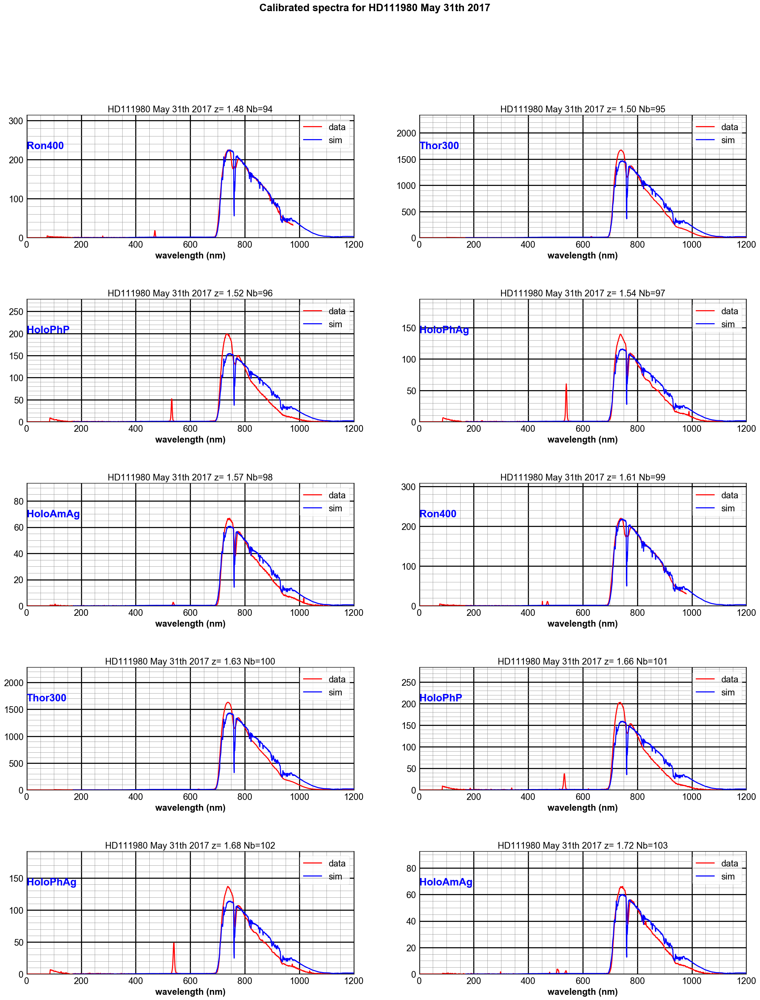

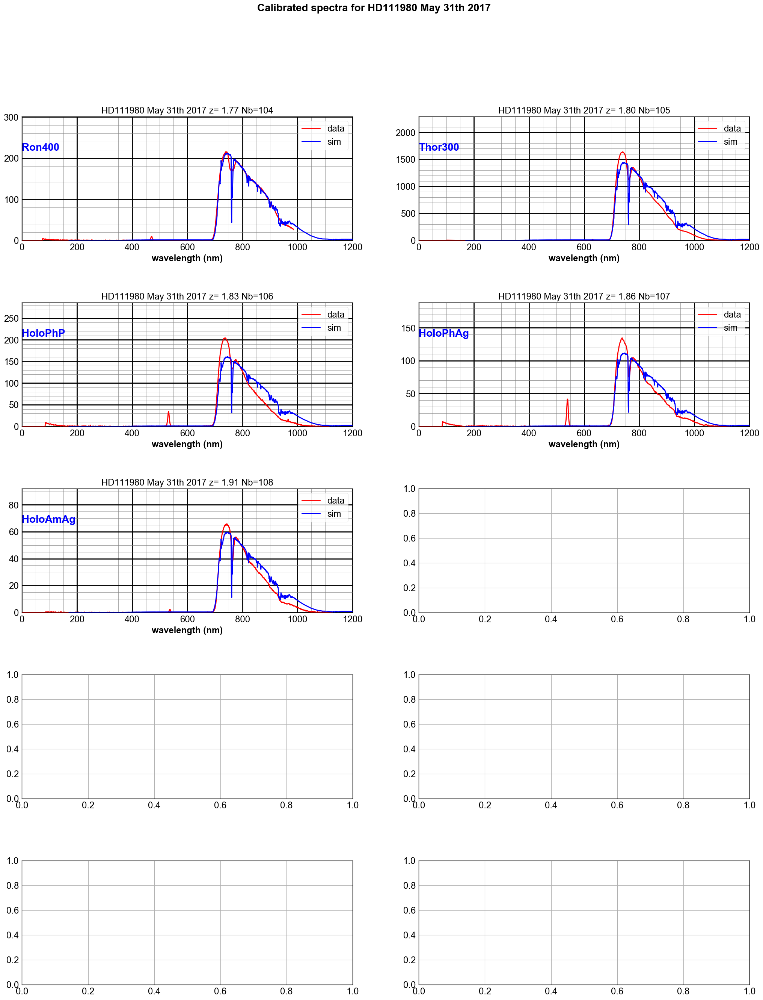

In [71]:

all_calibdatasimfactors=ShowSpectra(all_rightspectra_data,all_rightspectra_wl,all_titles,object_name,all_filt,dir_top_images,simspectra_data)

# Start the analysis

## Few definition

In [72]:
wl_O2Aline=759.37      # Balmer Lines
wl_O2Bline=686.719
wl_Haline=656.281 
wl_Hbline=486.134
wl_Hgline=434.047 
wl_Hdline=410.175
wl_Heline=397.0

In [73]:
def ShowOneSpectrum(sel):
    """
    ShowOneSpectrum
    ================
    """

    # get sim spectrum
    wl_sim=simspectra_data[0]/10.
    spectrum_sim=simspectra_data[sel+1]*all_calibdatasimfactors[sel] # sim
    
    
    # get the data
    thespectrum=all_rightspectra_data[sel]
    thewl=all_rightspectra_wl[sel]
    
    
    
    ymin=thespectrum.min()
    ymax=thespectrum.max()*1.1

    fig, ax = plt.subplots(1, 1, figsize=(15,8))


    ax.plot(thewl,thespectrum,'r-',lw=2,label='data')
    ax.plot(wl_sim,spectrum_sim,'b-',lw=2,label='sim')

    max_y_to_plot=thespectrum[:].max()*1.2
    ax.set_ylim(0.,max_y_to_plot)
    ax.text(0.,max_y_to_plot*1.1/1.2, all_filt[sel],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)

    ax.set_title(all_titles[sel])
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.plot([wl_O2Aline,wl_O2Aline],[ymin,ymax],'b-',label='$O_2(A)$',lw=1)
    ax.plot([wl_O2Bline,wl_O2Bline],[ymin,ymax],'b-',label='$O_2(B)$',lw=1)
    ax.plot([wl_Haline,wl_Haline],[ymin,ymax],'r-',label='$H_{alpha}$',lw=1)
    ax.plot([wl_Hbline,wl_Hbline],[ymin,ymax],'g-',label='$H_{beta}$',lw=1)
    ax.plot([wl_Hgline,wl_Hgline],[ymin,ymax],'c-',label='$H_{gamma}$',lw=1)
    ax.plot([wl_Hdline,wl_Hdline],[ymin,ymax],'k-',label='$H_{delta}$',lw=1)
    ax.plot([wl_Heline,wl_Heline],[ymin,ymax],'y-',label='$H_{delta}$',lw=1)

    ax.legend(loc=3,fontsize=20)
    ax.set_xlim(0,1100)
    ax.set_xlabel("$\lambda$ (nm)")
    
    figfilename=os.path.join(dir_top_images,'one_intput_calibrated_spectra.pdf')
    fig.savefig(figfilename)

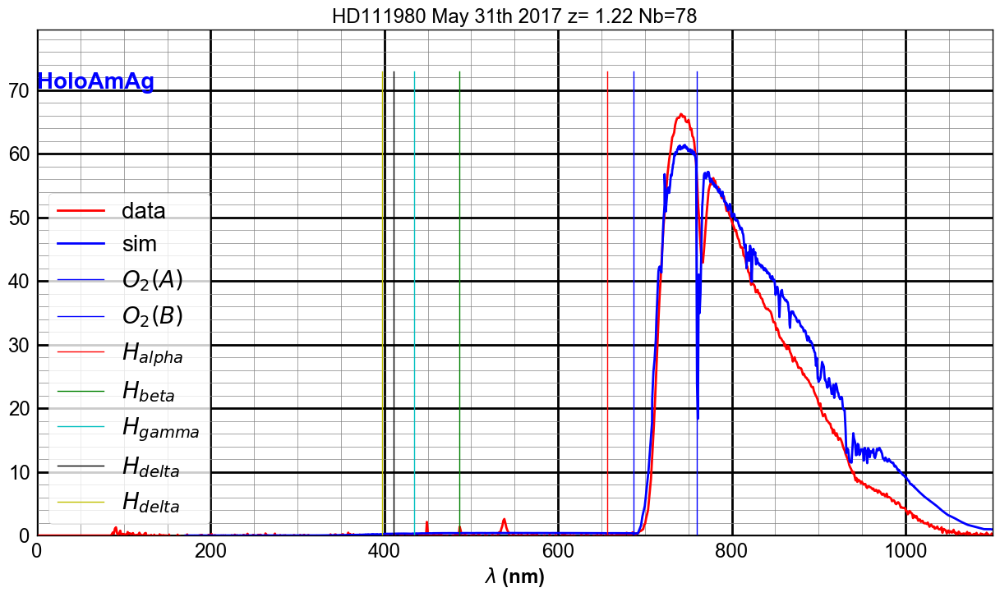

In [74]:
ShowOneSpectrum(4)

In [75]:
def ShowOneSpectrumNextFilt(sel):
    """
    ShowOneSpectrum
    ================
    """

    NBSPECTOPLOT=5
    
    the_spectra= []
    the_wl=[]
    the_max = []
    the_label= []
    
    for i in np.arange(NBSPECTOPLOT):

        the_spectrum=all_rightspectra_data[sel+i]
        thewl=all_rightspectra_wl[sel+i]
        theymin=the_spectrum.min()
        theymax=the_spectrum.max()
        thelabel=all_filt[sel+i]
        
        the_spectra.append(the_spectrum)
        the_wl.append(thewl)
        the_max.append(theymax)
        the_label.append(thelabel)

        
    fig, ax = plt.subplots(1, 1, figsize=(15,8))
    for i in np.arange(NBSPECTOPLOT):        
        ax.plot(the_wl[i],the_spectra[i],lw=3,label=the_label[i])

 
        
    max_y_to_plot=(np.array(the_max)).max()
    ymin=0
    ymax=max_y_to_plot
    ax.set_ylim(0.,max_y_to_plot)
    
    ax.set_title(all_titles[sel])
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.plot([wl_O2Aline,wl_O2Aline],[ymin,ymax],'b:',label='$O_2(A)$',lw=3)
    ax.plot([wl_O2Bline,wl_O2Bline],[ymin,ymax],'b:',label='$O_2(B)$',lw=3)
    ax.plot([wl_Haline,wl_Haline],[ymin,ymax],'r:',label='$H_{alpha}$',lw=3)
    ax.plot([wl_Hbline,wl_Hbline],[ymin,ymax],'g:',label='$H_{beta}$',lw=3)
    ax.plot([wl_Hgline,wl_Hgline],[ymin,ymax],'c:',label='$H_{gamma}$',lw=3)
    ax.plot([wl_Hdline,wl_Hdline],[ymin,ymax],'k:',label='$H_{delta}$',lw=3)
    ax.plot([wl_Heline,wl_Heline],[ymin,ymax],'y:',label='$H_{delta}$',lw=3)

    ax.legend(loc='best',fontsize=20)
    ax.set_xlim(0,1100)
    ax.set_xlabel("$\lambda$ (nm)")
    
    figfilename=os.path.join(dir_top_images,'five_intput_calibrated_spectra.pdf')
    fig.savefig(figfilename)

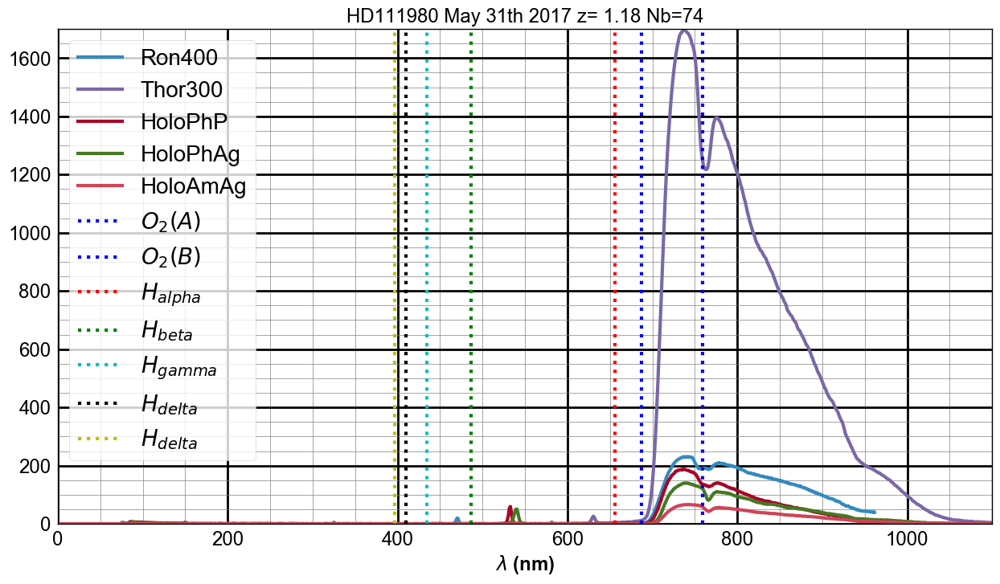

In [76]:
 ShowOneSpectrumNextFilt(0)

# Measurement of Equivalent Width
==============================================

## Select the spectrum under study

In [77]:
sel=0 # spectrum number

In [78]:
thespectrum=all_rightspectra_data[sel]
thewl=all_rightspectra_wl[sel]
thelabel=all_filt[sel]
thespecstaterr=all_rightspectra_data_staterr[sel]

In [79]:
wl_sim=simspectra_data[sel]/10.
spectrum_sim=simspectra_data[sel+1]*all_calibdatasimfactors[sel] # sim

## O2 absorption line

In [80]:
#O2WL1=732
#O2WL2=744
O2WL1=740
O2WL2=750
O2WL3=780
O2WL4=790

In [81]:
def ShowEquivalentWidth(wl,spec,wl1,wl2,wl3,wl4):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    plt.figure()
    plt.plot(wl_cut,spec_cut)
    plt.plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    plt.plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    plt.plot(x_cont,y_cont,'o')
    
    plt.plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    plt.grid(True)
    plt.title('Equivalent width computation')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    plt.figure()
    plt.plot(wl_cut,ratio)
    plt.plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    plt.plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    plt.grid(True)
    
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    return equivalent_width

In [147]:

import numpy.core.numeric as NX
from numpy.core import isscalar, abs, finfo, atleast_1d, hstack, dot
from numpy.lib.twodim_base import diag, vander
from numpy.lib.function_base import trim_zeros, sort_complex
from numpy.lib.type_check import iscomplex, real, imag
from numpy.linalg import eigvals, lstsq, inv


In [188]:
def polyfit(x, y, deg, rcond=None, full=False, w=None, cov=False):
    """
    Least squares polynomial fit.
    Fit a polynomial ``p(x) = p[0] * x**deg + ... + p[deg]`` of degree `deg`
    to points `(x, y)`. Returns a vector of coefficients `p` that minimises
    the squared error.
    Parameters
    ----------
    x : array_like, shape (M,)
        x-coordinates of the M sample points ``(x[i], y[i])``.
    y : array_like, shape (M,) or (M, K)
        y-coordinates of the sample points. Several data sets of sample
        points sharing the same x-coordinates can be fitted at once by
        passing in a 2D-array that contains one dataset per column.
    deg : int
        Degree of the fitting polynomial
    rcond : float, optional
        Relative condition number of the fit. Singular values smaller than
        this relative to the largest singular value will be ignored. The
        default value is len(x)*eps, where eps is the relative precision of
        the float type, about 2e-16 in most cases.
    full : bool, optional
        Switch determining nature of return value. When it is False (the
        default) just the coefficients are returned, when True diagnostic
        information from the singular value decomposition is also returned.
    w : array_like, shape (M,), optional
        weights to apply to the y-coordinates of the sample points.
    cov : bool, optional
        Return the estimate and the covariance matrix of the estimate
        If full is True, then cov is not returned.
    Returns
    -------
    p : ndarray, shape (M,) or (M, K)
        Polynomial coefficients, highest power first.  If `y` was 2-D, the
        coefficients for `k`-th data set are in ``p[:,k]``.
    residuals, rank, singular_values, rcond :
        Present only if `full` = True.  Residuals of the least-squares fit,
        the effective rank of the scaled Vandermonde coefficient matrix,
        its singular values, and the specified value of `rcond`. For more
        details, see `linalg.lstsq`.
    V : ndarray, shape (M,M) or (M,M,K)
        Present only if `full` = False and `cov`=True.  The covariance
        matrix of the polynomial coefficient estimates.  The diagonal of
        this matrix are the variance estimates for each coefficient.  If y
        is a 2-D array, then the covariance matrix for the `k`-th data set
        are in ``V[:,:,k]``
    Warns
    -----
    RankWarning
        The rank of the coefficient matrix in the least-squares fit is
        deficient. The warning is only raised if `full` = False.
        The warnings can be turned off by
        >>> import warnings
        >>> warnings.simplefilter('ignore', np.RankWarning)
    See Also
    --------
    polyval : Computes polynomial values.
    linalg.lstsq : Computes a least-squares fit.
    scipy.interpolate.UnivariateSpline : Computes spline fits.
    Notes
    -----
    The solution minimizes the squared error
    .. math ::
        E = \\sum_{j=0}^k |p(x_j) - y_j|^2
    in the equations::
        x[0]**n * p[0] + ... + x[0] * p[n-1] + p[n] = y[0]
        x[1]**n * p[0] + ... + x[1] * p[n-1] + p[n] = y[1]
        ...
        x[k]**n * p[0] + ... + x[k] * p[n-1] + p[n] = y[k]
    The coefficient matrix of the coefficients `p` is a Vandermonde matrix.
    `polyfit` issues a `RankWarning` when the least-squares fit is badly
    conditioned. This implies that the best fit is not well-defined due
    to numerical error. The results may be improved by lowering the polynomial
    degree or by replacing `x` by `x` - `x`.mean(). The `rcond` parameter
    can also be set to a value smaller than its default, but the resulting
    fit may be spurious: including contributions from the small singular
    values can add numerical noise to the result.
    Note that fitting polynomial coefficients is inherently badly conditioned
    when the degree of the polynomial is large or the interval of sample points
    is badly centered. The quality of the fit should always be checked in these
    cases. When polynomial fits are not satisfactory, splines may be a good
    alternative.
    References
    ----------
    .. [1] Wikipedia, "Curve fitting",
           http://en.wikipedia.org/wiki/Curve_fitting
    .. [2] Wikipedia, "Polynomial interpolation",
           http://en.wikipedia.org/wiki/Polynomial_interpolation
    Examples
    --------
    >>> x = np.array([0.0, 1.0, 2.0, 3.0,  4.0,  5.0])
    >>> y = np.array([0.0, 0.8, 0.9, 0.1, -0.8, -1.0])
    >>> z = np.polyfit(x, y, 3)
    >>> z
    array([ 0.08703704, -0.81349206,  1.69312169, -0.03968254])
    It is convenient to use `poly1d` objects for dealing with polynomials:
    >>> p = np.poly1d(z)
    >>> p(0.5)
    0.6143849206349179
    >>> p(3.5)
    -0.34732142857143039
    >>> p(10)
    22.579365079365115
    High-order polynomials may oscillate wildly:
    >>> p30 = np.poly1d(np.polyfit(x, y, 30))
    /... RankWarning: Polyfit may be poorly conditioned...
    >>> p30(4)
    -0.80000000000000204
    >>> p30(5)
    -0.99999999999999445
    >>> p30(4.5)
    -0.10547061179440398
    Illustration:
    >>> import matplotlib.pyplot as plt
    >>> xp = np.linspace(-2, 6, 100)
    >>> _ = plt.plot(x, y, '.', xp, p(xp), '-', xp, p30(xp), '--')
    >>> plt.ylim(-2,2)
    (-2, 2)
    >>> plt.show()
    """
    order = int(deg) + 1
    x = NX.asarray(x) + 0.0
    y = NX.asarray(y) + 0.0

    # check arguments.
    if deg < 0:
        raise ValueError("expected deg >= 0")
    if x.ndim != 1:
        raise TypeError("expected 1D vector for x")
    if x.size == 0:
        raise TypeError("expected non-empty vector for x")
    if y.ndim < 1 or y.ndim > 2:
        raise TypeError("expected 1D or 2D array for y")
    if x.shape[0] != y.shape[0]:
        raise TypeError("expected x and y to have same length")

    # set rcond
    if rcond is None:
        rcond = len(x)*finfo(x.dtype).eps

    # set up least squares equation for powers of x
    lhs = vander(x, order)
    rhs = y

    # apply weighting
    if w is not None:
        w = NX.asarray(w) + 0.0
        if w.ndim != 1:
            raise TypeError("expected a 1-d array for weights")
        if w.shape[0] != y.shape[0]:
            raise TypeError("expected w and y to have the same length")
        lhs *= w[:, NX.newaxis]
        if rhs.ndim == 2:
            rhs *= w[:, NX.newaxis]
        else:
            rhs *= w

    # scale lhs to improve condition number and solve
    scale = NX.sqrt((lhs*lhs).sum(axis=0))
    lhs /= scale
    
    
    print 'MyPolyfit lhs      =   ', lhs
    
    rcond =len(x)*2e-16
    
    c, resids, rank, s = lstsq(lhs, rhs, rcond)
    c = (c.T/scale).T  # broadcast scale coefficients
    
    
    print 'MyPolyfit  c, resids, rank, s   =  ',   c, resids, rank, s
    
    
    

    # warn on rank reduction, which indicates an ill conditioned matrix
    if rank != order and not full:
        msg = "Polyfit may be poorly conditioned"
        warnings.warn(msg, RankWarning)

    if full:
        return c, resids, rank, s, rcond
    elif cov:
        Vbase = inv(dot(lhs.T, lhs))
        Vbase /= NX.outer(scale, scale)
        # Some literature ignores the extra -2.0 factor in the denominator, but
        #  it is included here because the covariance of Multivariate Student-T
        #  (which is implied by a Bayesian uncertainty analysis) includes it.
        #  Plus, it gives a slightly more conservative estimate of uncertainty.
        fac = resids / (len(x) - order - 2.0)
        if y.ndim == 1:
            return c, Vbase * fac
        else:
            return c, Vbase[:,:, NX.newaxis] * fac
    else:
        return c

In [186]:
def ShowEquivalentWidthwthStatErr(wl,spec,specerr,wl1,wl2,wl3,wl4,ndeg=2):
    """
    ******************************************************************************
    ShowEquivalentWidthwthStatErr : show how the equivalent width must be computed
    
    - with errors
    - with non linear method
    
    *********************************************************************************
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    spec_cut_err=specerr[selected_indexes]
    
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    #############
    ### Figure 1
    #############
    plt.figure()
    
    plt.plot(wl_cut,spec_cut,'b-')
    plt.errorbar(wl_cut,spec_cut,yerr=spec_cut_err,color='red',fmt='o')
    
    # vertical bars
    plt.plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    plt.plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    
    # continuum fit
    #------------------
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))

    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    y_cont_err=specerr[continuum_indexes]
    y_w=1./y_cont_err
    y_w[np.where(y_cont==0)]=0. # erase the empty bins
   
    
    popt_p , pcov_p= np.polyfit(x_cont, y_cont,ndeg,w=y_w,full=False,cov=True,rcond=2.0e-16*len(x_cont)) #rcond mandatory
    
    z_cont_fit=popt_p
      
    print ' z_cont_fit  ', z_cont_fit, ' pcov = ',pcov_p
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    plt.errorbar(x_cont,y_cont,yerr=y_cont_err,fmt='o',color='black')
    plt.plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    plt.grid(True)
    plt.title('Equivalent width computation')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    # only one type of error, need also the error due to fit
    ratioerr=spec_cut_err/full_continum
    
    ###################
    ### Second figure
    #################
    plt.figure()
    plt.plot(wl_cut,ratio,lw=2,color='blue')
    plt.errorbar(wl_cut,ratio,yerr=ratioerr,fmt='o',lw=2,color='red')
    plt.plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    plt.plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    plt.grid(True)
    
    
    # Compute now the equavalent width
    #--------------------------------
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin in wavelength

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width and its error
    #-------------------------------------------------
    absorption_band=wl_bin_size*(1-ratio)
    absorption_band_error=wl_bin_size*ratioerr
    
    equivalent_width= absorption_band.sum()
    
    # quadratic sum of errors for each wl bin
    equivalend_width_error=np.sqrt((absorption_band_error*absorption_band_error).sum() )
    
    return equivalent_width,equivalend_width_error

In [197]:
def ShowEquivalentWidthNonLinear(wl,spec,wl1,wl2,wl3,wl4,ndeg=3):
    """
    ShowEquivalentWidthNonLinear : show how the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
   
    
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    plt.figure()
    plt.plot(wl_cut,spec_cut)
    plt.plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    plt.plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,ndeg)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    plt.plot(x_cont,y_cont,'o')
    
    plt.plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    plt.grid(True)
    plt.title('Equivalent width computation')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    plt.figure()
    plt.plot(wl_cut,ratio)
    plt.plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    plt.plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    plt.grid(True)
    
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    return equivalent_width

 z_cont_fit   [  9.11517751e-03  -1.44965997e+01   5.96738441e+03]  pcov =  [[  3.56021922e-05  -5.44769871e-02   2.08251791e+01]
 [ -5.44769871e-02   8.33596208e+01  -3.18667466e+04]
 [  2.08251791e+01  -3.18667466e+04   1.21822104e+07]]


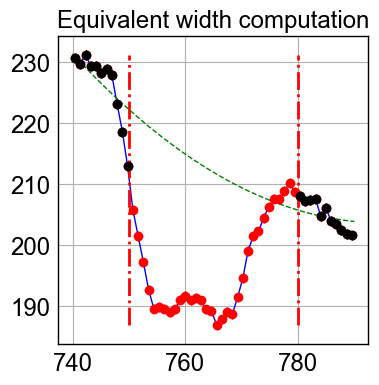

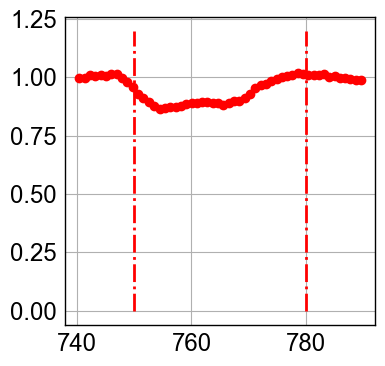

In [187]:
EQW_DATA, EQW_DATA_ERR= ShowEquivalentWidthwthStatErr(thewl,thespectrum,thespecstaterr,O2WL1,O2WL2,O2WL3,O2WL4)

In [85]:
print EQW_DATA, EQW_DATA_ERR

2.27946 0.0188377


/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:24: RankWarning: Polyfit may be poorly conditioned


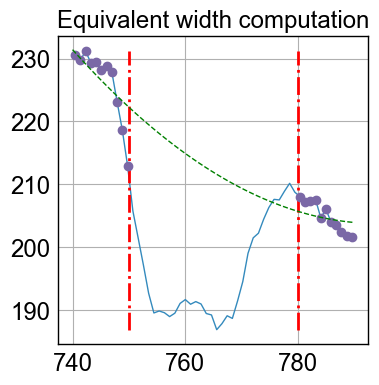

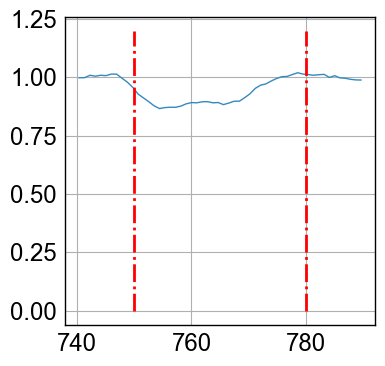

In [198]:
EQW_DATA = ShowEquivalentWidthNonLinear(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4)

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:24: RankWarning: Polyfit may be poorly conditioned


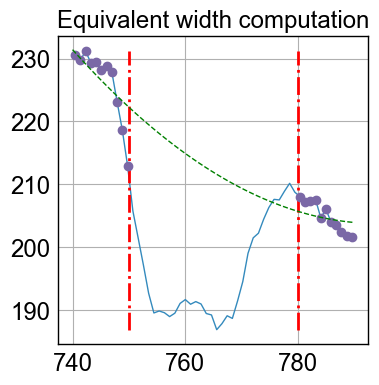

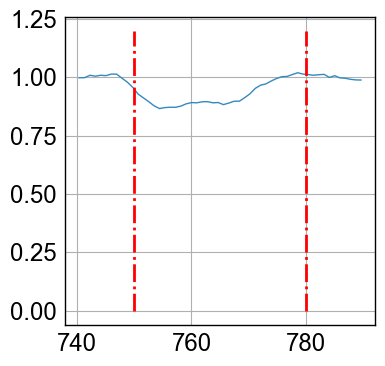

In [199]:
EQW_DATA = ShowEquivalentWidthNonLinear(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4)

In [ ]:
EQW_SIM = ShowEquivalentWidthNonLinear(wl_sim,spectrum_sim,O2WL1,O2WL2,O2WL3,O2WL4)

In [232]:
def ComputeEquivalentWidthNonLinear(wl,spec,wl1,wl2,wl3,wl4,ndeg=3):
    """
    ComputeEquivalentWidth : compute the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
     
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,ndeg)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    

    # compute bin size in the band
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                                  
    
    # calculation of equivalent width    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()    
    
    return equivalent_width

In [231]:
def ComputeEquivalentWidthNonLinearwthStatErr(wl,spec,thespecstaterr,wl1,wl2,wl3,wl4,ndeg=3):
    """
    ComputeEquivalentWidth : compute the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
     
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,ndeg)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    

    # compute bin size in the band
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                                  
    
    # calculation of equivalent width    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()    
    
    return equivalent_width

In [ ]:
def ShowEquivalentWidth2(wl,spec,wl1,wl2,wl3,wl4,label='absortion line'):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    
    f, axarr = plt.subplots(1,2,figsize=(9,3))
    
    
    ## Figure 1
    ##------------
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    axarr[0].plot(wl_cut,spec_cut)
    axarr[0].plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    axarr[0].plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    axarr[0].plot(x_cont,y_cont,'o')
    axarr[0].plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    axarr[0].grid(True)
    axarr[0].set_xlabel('$\lambda$ (nm)')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    # Figure 2
    #-----------
    axarr[1].plot(wl_cut,ratio)
    axarr[1].plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    axarr[1].plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    axarr[1].grid(True)
    
    axarr[1].set_xlabel('$\lambda$ (nm)')
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    title = 'Equivalent width computation for {}'.format(label)
    f.suptitle(title)
    
    return equivalent_width

In [203]:
def ShowEquivalentWidth2NonLinear(wl,spec,wl1,wl2,wl3,wl4,label='absortion line',ndeg=3):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    
    f, axarr = plt.subplots(1,2,figsize=(9,3))
    
    
    ## Figure 1
    ##------------
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    axarr[0].plot(wl_cut,spec_cut)
    axarr[0].plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    axarr[0].plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,ndeg)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    axarr[0].plot(x_cont,y_cont,'o')
    axarr[0].plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    axarr[0].grid(True)
    axarr[0].set_xlabel('$\lambda$ (nm)')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    # Figure 2
    #-----------
    axarr[1].plot(wl_cut,ratio)
    axarr[1].plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    axarr[1].plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    axarr[1].grid(True)
    
    axarr[1].set_xlabel('$\lambda$ (nm)')
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    title = 'Equivalent width computation for {}'.format(label)
    f.suptitle(title)
    
    return equivalent_width

In [215]:
def errorfill(x, y, yerr, color=None, alpha_fill=0.3, ax=None):
    ax = ax if ax is not None else plt.gca()
    if color is None:
        color = ax._get_lines.color_cycle.next()
    if np.isscalar(yerr) or len(yerr) == len(y):
        ymin = y - yerr
        ymax = y + yerr
    elif len(yerr) == 2:
        ymin, ymax = yerr
    ax.plot(x, y, color=color)
    ax.fill_between(x, ymax, ymin, color=color, alpha=alpha_fill)

In [269]:
def ShowEquivalentWidth2NonLinearwthStatErr(wl,spec,specerr,wl1,wl2,wl3,wl4,label='absortion line',ndeg=3):
    """
    ***********************************************************************
    ShowEquivalentWidth2NonLinearwthStatErr : 
    
    Fit equivalent width:
    - Non linear
    - with errors
    
    ************************************************************************
    """
    
    f, axarr = plt.subplots(1,2,figsize=(9,3))
    
    order=ndeg+1
    
    #######################
    ## Figure 1
    #########################
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    spec_cut_err=specerr[selected_indexes]
    
    
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    # plot points
    axarr[0].plot(wl_cut,spec_cut,'b-')
    axarr[0].errorbar(wl_cut,spec_cut,yerr=spec_cut_err,color='red',fmt='o')
    
    # plot vertical bars
    axarr[0].plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    axarr[0].plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    # continuum fit
    #----------------
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    
    # error for continum
    y_cont_err=specerr[continuum_indexes]
    y_w=1./y_cont_err
    y_w[np.where(y_cont==0)]=0. # erase the empty bins
    
    popt_p , pcov_p= np.polyfit(x_cont, y_cont,ndeg,w=y_w,full=False,cov=True,rcond=2.0e-16*len(x_cont)) #rcond mandatory
    
    z_cont_fit=popt_p
      
   
    pol_cont_fit=np.poly1d(z_cont_fit)
    

    # compute the fit and propagate the error
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    fit_line_y_err = []
    for thex in fit_line_x:
        dfdx = [ thex**thepow for thepow in np.arange(ndeg,-1,-1)]
        dfdx=np.array(dfdx)
        propagated_error=np.dot(dfdx.T,np.dot(pcov_p,dfdx))
        fit_line_y_err.append(propagated_error)
    fit_line_y_err=np.array(fit_line_y_err)
    
    
    errorfill(fit_line_x,fit_line_y,fit_line_y_err,color='grey',ax=axarr[0])
    axarr[0].errorbar(x_cont,y_cont,yerr=y_cont_err,fmt='.',color='red')
    
       
    axarr[0].grid(True)
    axarr[0].set_xlabel('$\lambda$ (nm)')
    
    # compute the ratio spectrum/continuum and its error
    # -------------------------------------
    full_continum=pol_cont_fit(wl_cut)  
    
    full_continum_err= []
    for wl in wl_cut:
        dfdx = [ wl**thepow for thepow in np.arange(ndeg,-1,-1)]
        dfdx=np.array(dfdx)
        propagated_error=np.dot(dfdx.T,np.dot(pcov_p,dfdx))
        full_continum_err.append(propagated_error)
    full_continum_err=np.array(full_continum_err)
    
    
    ratio=spec_cut/full_continum
    # error not correlated    
    ratio_err=ratio*np.sqrt( (spec_cut_err/spec_cut)**2+ (full_continum_err/full_continum)**2)
    

    
    ##################
    # Figure 2
    ###################
    
    axarr[1].plot(wl_cut,ratio,lw=2,color='blue')
    axarr[1].errorbar(wl_cut,ratio,yerr=ratio_err,fmt='.',lw=2,color='red')
    axarr[1].plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    axarr[1].plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    axarr[1].grid(True)
    axarr[1].set_ylim(0.8*ratio.min(),1.2*ratio.max())
    axarr[1].set_xlabel('$\lambda$ (nm)')
    
    
    #compute the equavalent width
    #-----------------------------
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width and its error (units nm because wl in nm)
    # ----------------------------------------------
    absorption_band=wl_bin_size*(1-ratio)
    absorption_band_error=wl_bin_size*ratio_err
    equivalent_width= absorption_band.sum()
    equivalent_width_err=np.sqrt((absorption_band_error**2).sum())
    
    
    title = 'Equivalent width computation for {}'.format(label)
    f.suptitle(title)
    
    return equivalent_width,equivalent_width_err

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned


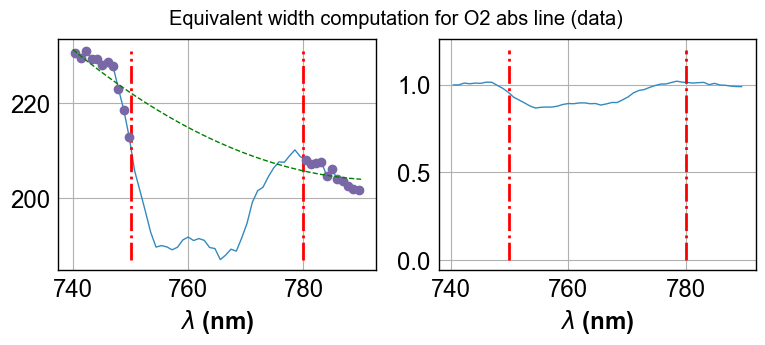

In [204]:
EQW_DATA = ShowEquivalentWidth2NonLinear(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4,'O2 abs line (data)')

(2.8960097, 0.01376849798134298)

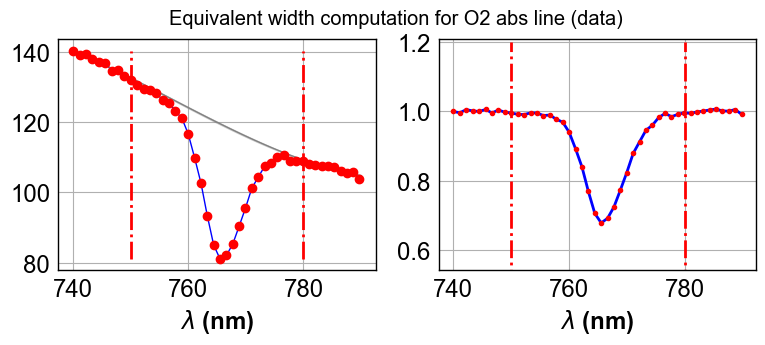

In [270]:
ShowEquivalentWidth2NonLinearwthStatErr(thewl,thespectrum,thespecstaterr,O2WL1,O2WL2,O2WL3,O2WL4,'O2 abs line (data)')

In [229]:
print EQW_DATA

2.27946


In [233]:
print ComputeEquivalentWidthNonLinear(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4)

2.27946


/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:16: RankWarning: Polyfit may be poorly conditioned


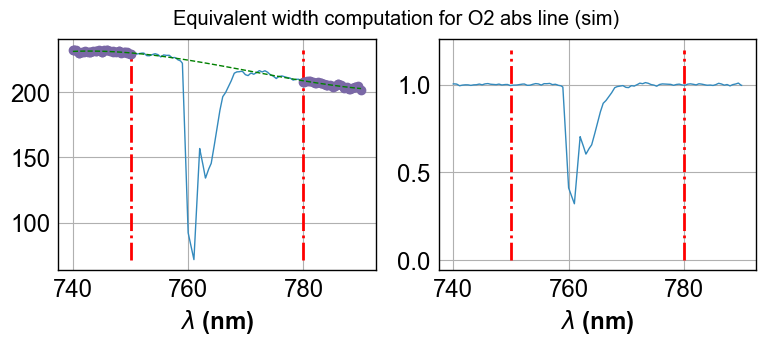

In [234]:
EQW_SIM = ShowEquivalentWidth2NonLinear(wl_sim,spectrum_sim,O2WL1,O2WL2,O2WL3,O2WL4,'O2 abs line (sim)')

In [ ]:
print EQW_SIM

## A) O2 absorption line
-------------------------------

In [242]:
EQW_DATA_O2 = ComputeEquivalentWidthNonLinear(thewl,thespectrum,732,744,770,790)

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:16: RankWarning: Polyfit may be poorly conditioned


In [243]:
print ' EQW_DATA(O2) = ',EQW_DATA_O2, 'nm'

 EQW_DATA(O2) =  1.81299 nm


In [240]:
WL1_O2_DATA=O2WL1
WL2_O2_DATA=O2WL2
WL3_O2_DATA=O2WL3
WL4_O2_DATA=O2WL4

In [239]:
WL1_O2_SIM=O2WL1
WL2_O2_SIM=O2WL2
WL3_O2_SIM=O2WL3
WL4_O2_SIM=O2WL4

In [238]:
def ShowAllEquivalentWidth(all_wl,all_spec,wl1,wl2,wl3,wl4,label='absorption line'):
        
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        
        newlabel = label+ ' for img {} with disp {}'.format(index,all_filt[index]) 
        
        ShowEquivalentWidth2(wl,spectrum,wl1,wl2,wl3,wl4,label=newlabel)


In [237]:
def ShowAllEquivalentWidthNonLinear(all_wl,all_spec,wl1,wl2,wl3,wl4,label='absorption line'):
        
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        
        newlabel = label+ ' for img {} with disp {}'.format(index,all_filt[index]) 
        
        ShowEquivalentWidth2NonLinear(wl,spectrum,wl1,wl2,wl3,wl4,label=newlabel)


In [273]:
def ShowAllEquivalentWidthNonLinearwthStatErr(all_wl,all_spec,all_staterr,wl1,wl2,wl3,wl4,label='absorption line'):
        
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        specerr=all_staterr[index]
        wl=all_wl[index]
        
        newlabel = label+ ' for img {} with disp {}'.format(index,all_filt[index]) 
        
        eqw,eqwerr=ShowEquivalentWidth2NonLinearwthStatErr(wl,spectrum,specerr,wl1,wl2,wl3,wl4,label=newlabel)

        print eqw,' nm',eqwerr, ' nm'    


In [264]:
def ComputeAllEquivalentWidth(all_wl,all_spec,wl1,wl2,wl3,wl4):
    
    EQW_coll = []
    
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        eqw=ComputeEquivalentWidth(wl,spectrum,wl1,wl2,wl3,wl4)
        EQW_coll.append(eqw)
        
    return EQW_coll

In [265]:
def ComputeAllEquivalentWidthNonLinear(all_wl,all_spec,wl1,wl2,wl3,wl4):
    
    EQW_coll = []
    
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        eqw=ComputeEquivalentWidthNonLinear(wl,spectrum,wl1,wl2,wl3,wl4)
        EQW_coll.append(eqw)
        
    return EQW_coll

2.27582  nm 0.092411886196  nm
3.05971  nm 0.0559489384327  nm
3.12964  nm 0.0289993917257  nm
2.90387  nm 0.0237619695111  nm
3.05016  nm 0.0274723736257  nm
1.82166  nm 0.0724979659161  nm
2.93466  nm 0.139593314845  nm
3.01601  nm 0.0297585428914  nm
2.82368  nm 0.0280900100086  nm
3.50055  nm 0.0275157406073  nm
2.15816  nm 0.0716691112152  nm
3.33922  nm 0.0604926634437  nm
3.25367  nm 0.0320291080879  nm
3.26775  nm 0.0232291825279  nm
3.37324  nm 0.0273282224278  nm
2.38003  nm 0.0889111938855  nm
3.26557  nm 0.03594722478  nm
3.29957  nm 0.040024618829  nm
3.29218  nm 0.0306019244302  nm
3.92336  nm 0.0321224991721  nm
2.42633  nm 0.091868113277  nm
3.55226  nm 0.0491284966762  nm
3.47108  nm 0.03838118136  nm
3.30953  nm 0.0223732742967  nm
3.79103  nm 0.0287371944205  nm
2.28918  nm 0.0658146786881  nm
3.11826  nm 0.11785160959  nm
3.47934  nm 0.0281238107604  nm
3.51244  nm 0.0253311140533  nm
3.77568  nm 0.0293417248375  nm
2.60387  nm 0.0912304985415  nm
3.55027  nm 0.0599

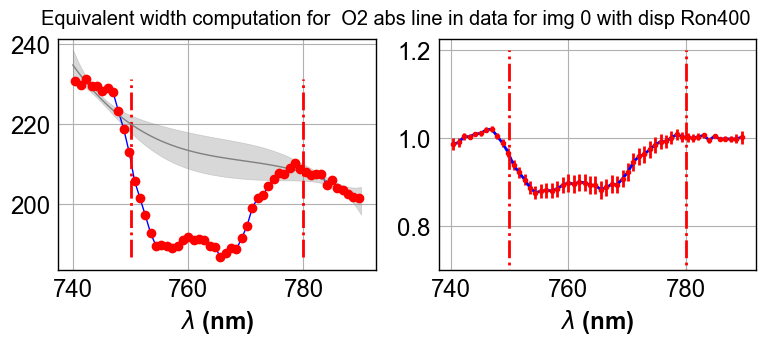

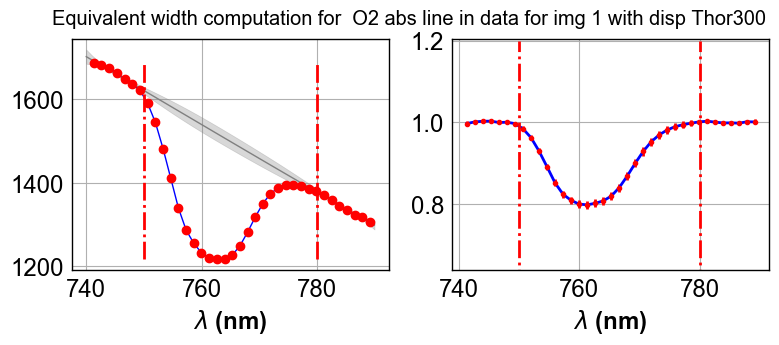

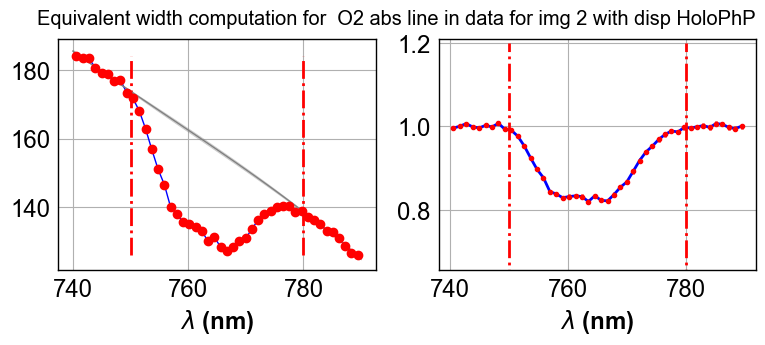

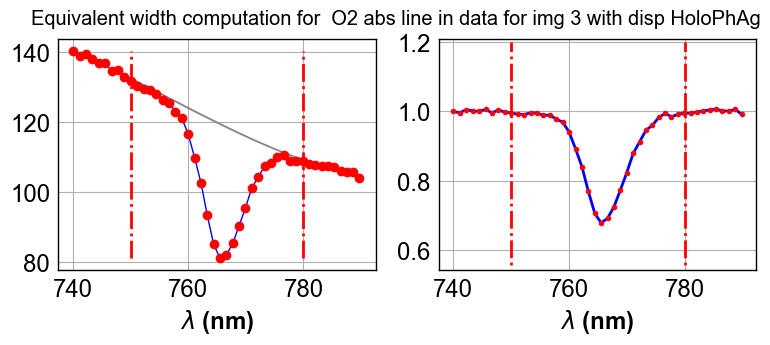

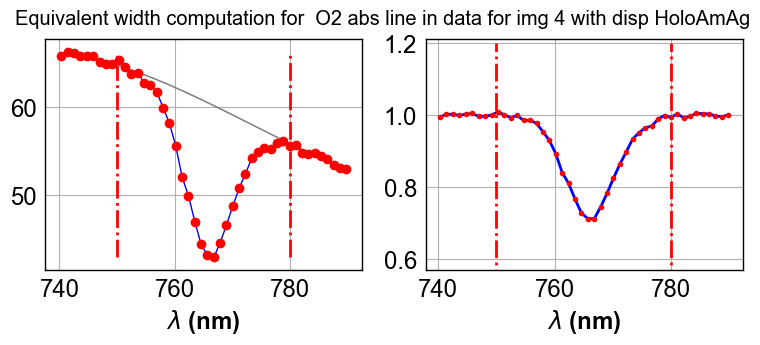

...

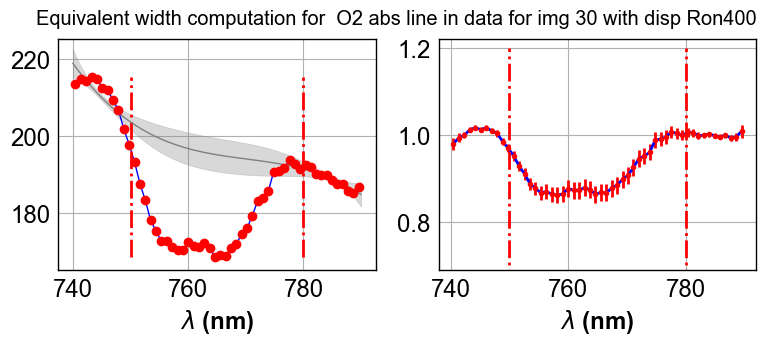

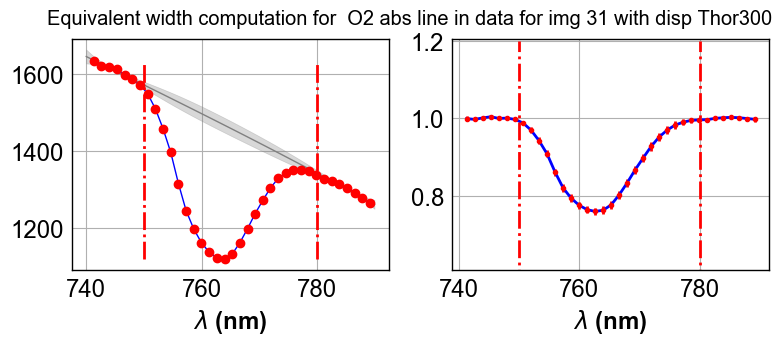

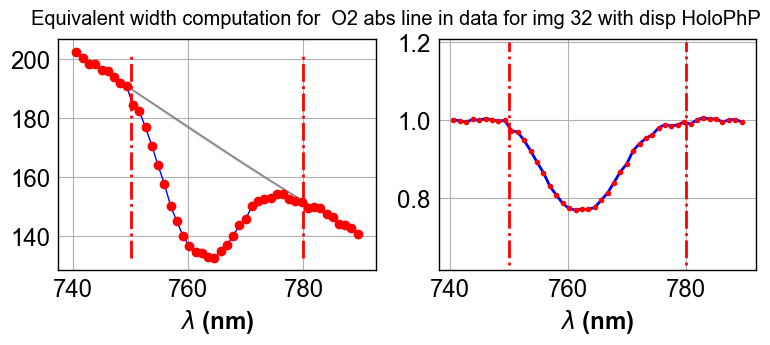

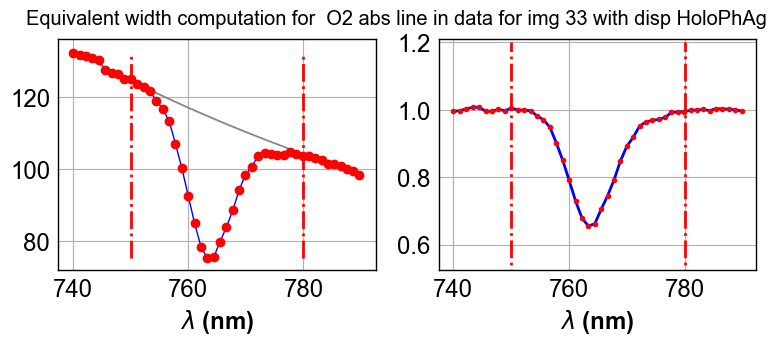

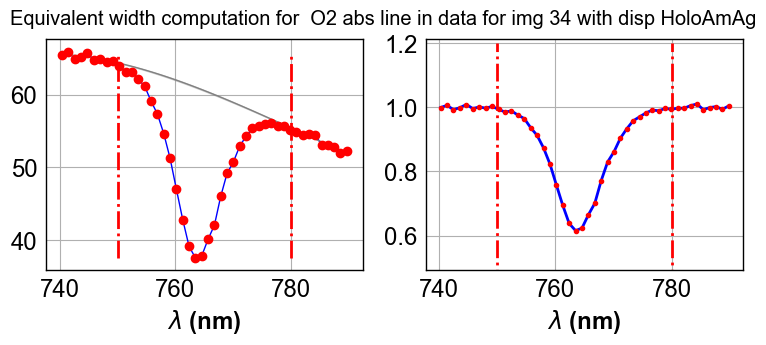

In [274]:
ShowAllEquivalentWidthNonLinearwthStatErr(all_rightspectra_wl,all_rightspectra_data,all_rightspectra_data_staterr,WL1_O2_DATA,WL2_O2_DATA,WL3_O2_DATA,WL4_O2_DATA,' O2 abs line in data')

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/li

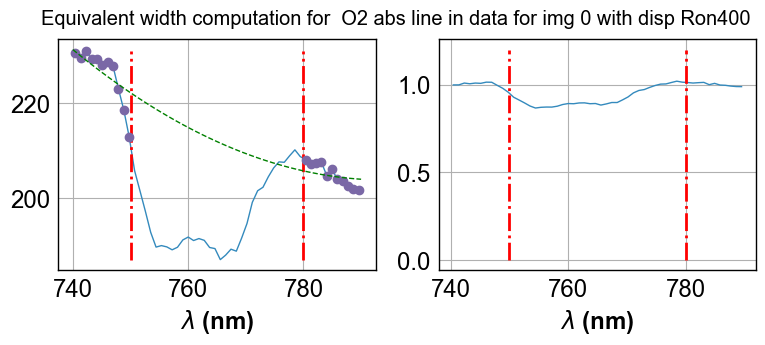

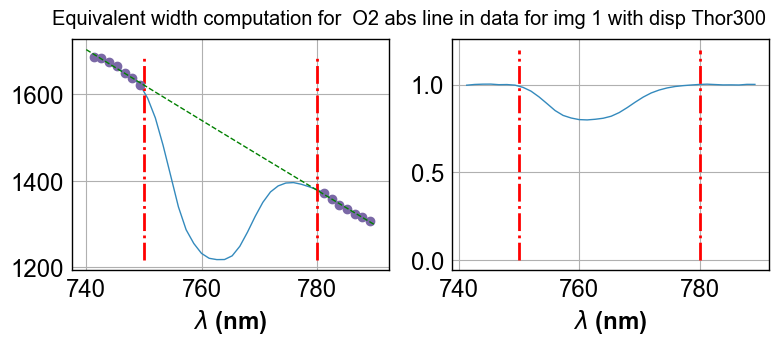

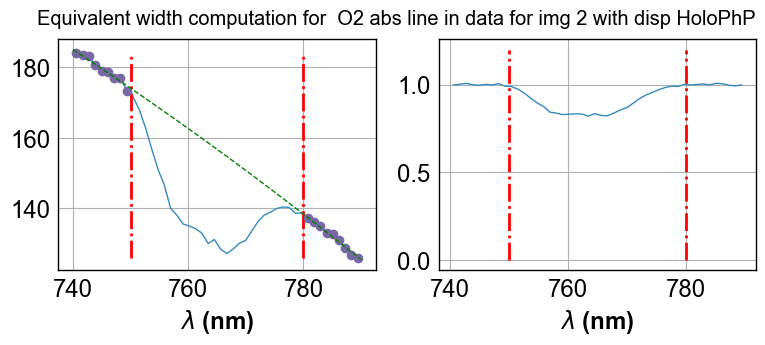

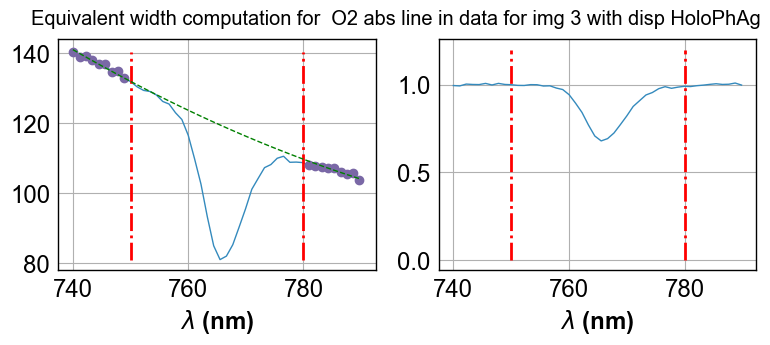

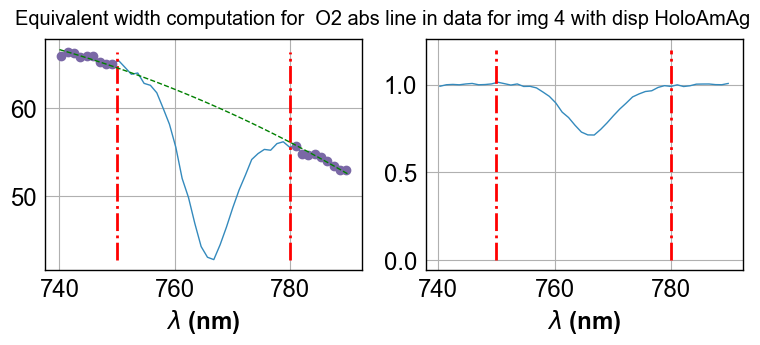

...

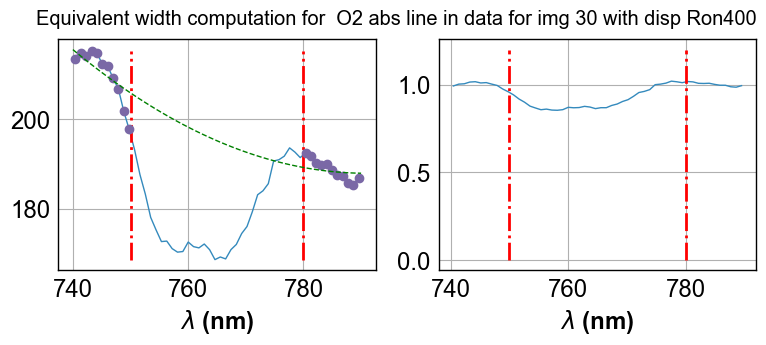

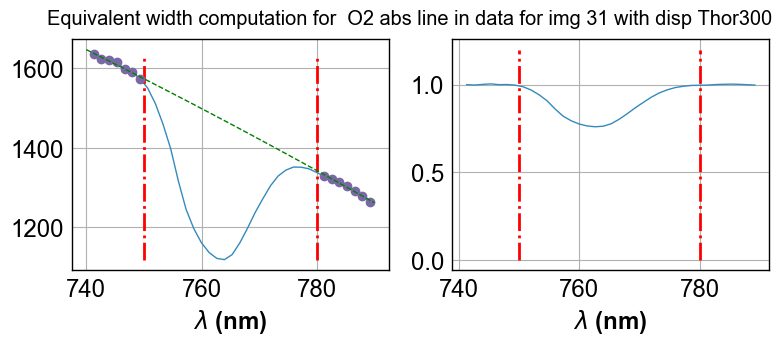

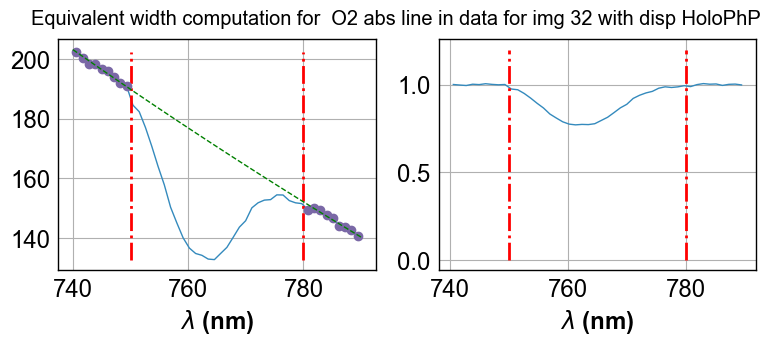

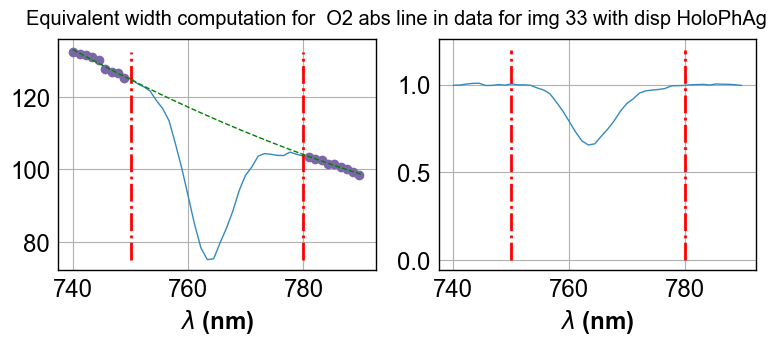

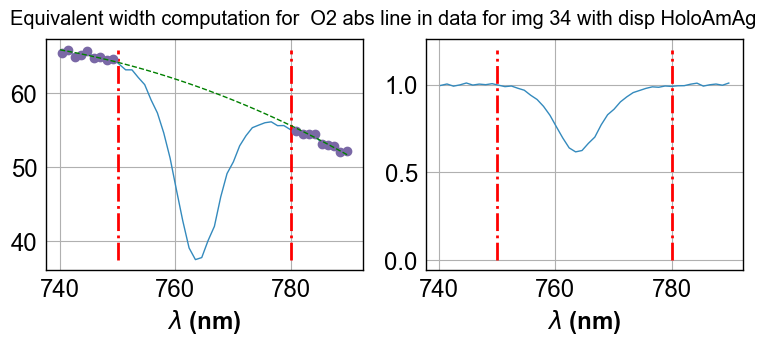

In [249]:
ShowAllEquivalentWidthNonLinear(all_rightspectra_wl,all_rightspectra_data,WL1_O2_DATA,WL2_O2_DATA,WL3_O2_DATA,WL4_O2_DATA,' O2 abs line in data')

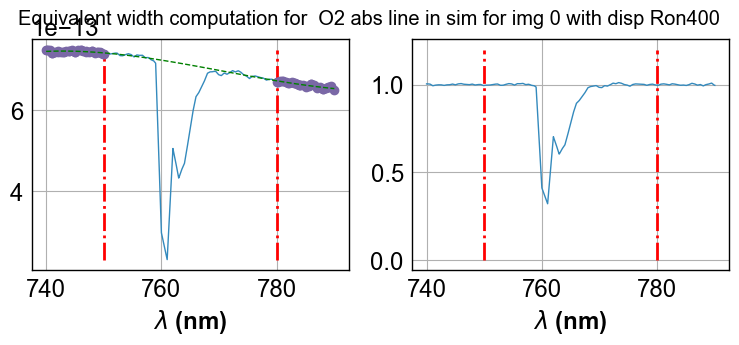

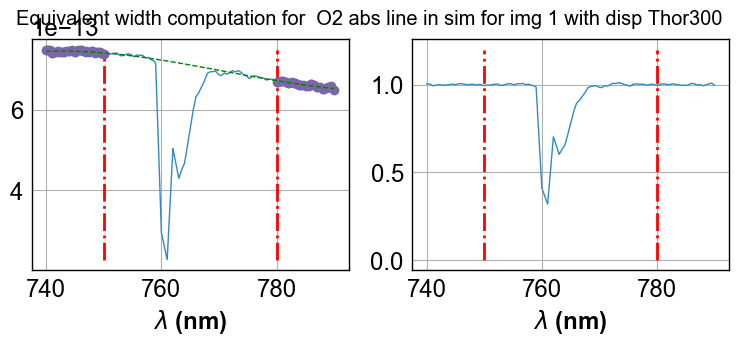

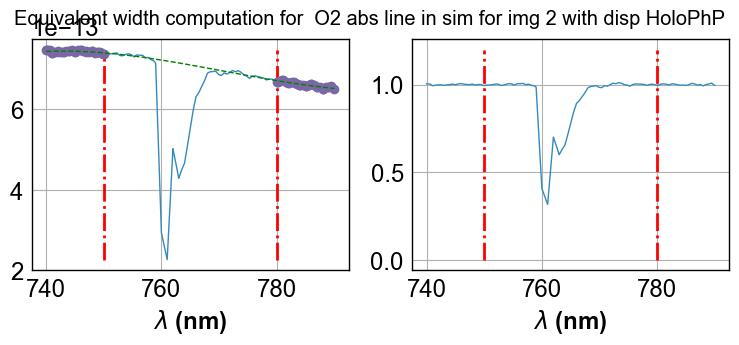

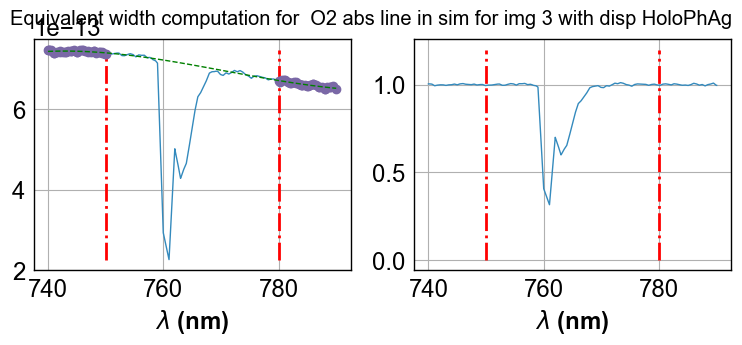

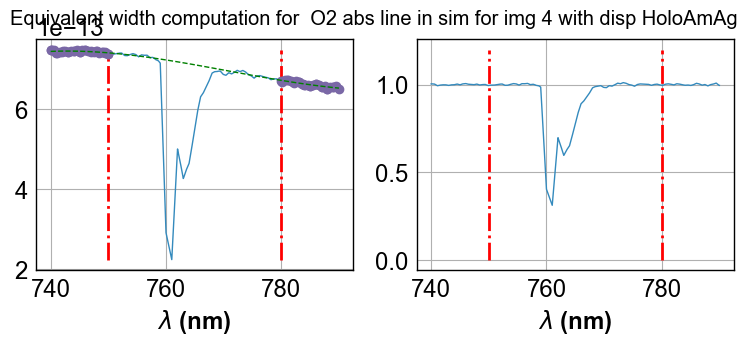

...

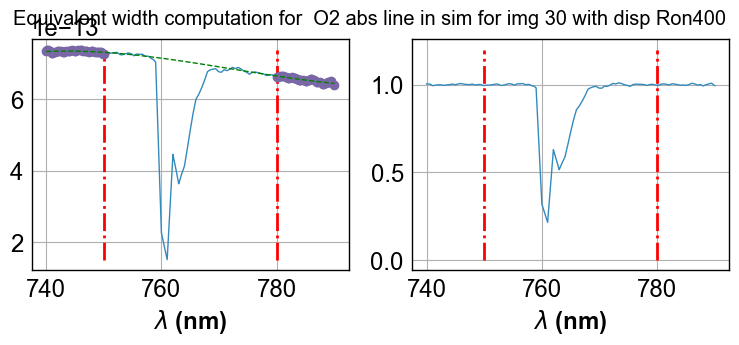

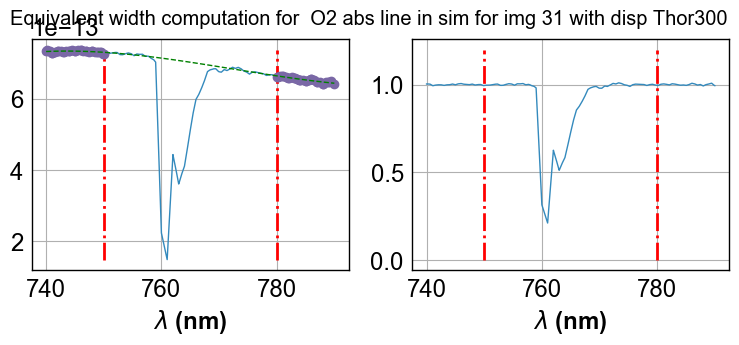

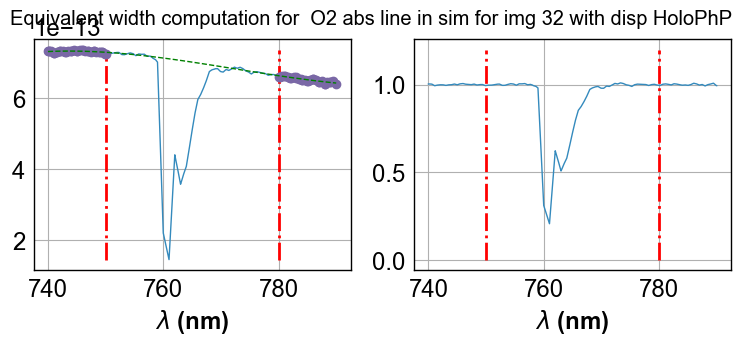

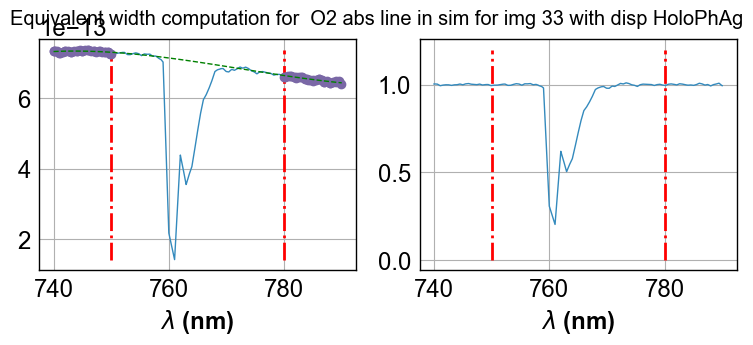

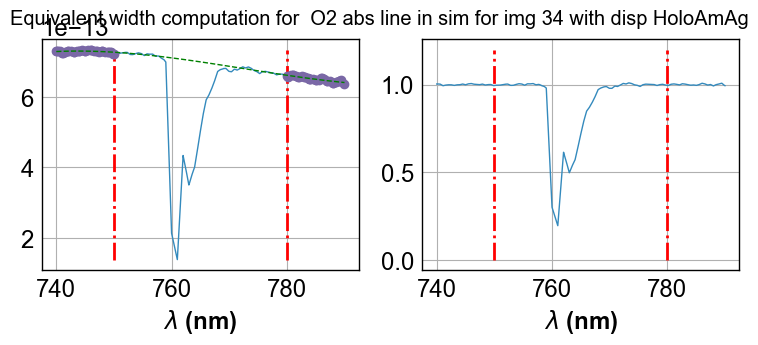

In [250]:
ShowAllEquivalentWidthNonLinear(allwl_sim,allspectra_sim,WL1_O2_SIM,WL2_O2_SIM,WL3_O2_SIM,WL4_O2_SIM,' O2 abs line in sim')

In [263]:
All_eqw_O2_Data=ComputeAllEquivalentWidthNonLinear(all_rightspectra_wl,all_rightspectra_data,WL1_O2_DATA,WL2_O2_DATA,WL3_O2_DATA,WL4_O2_DATA)

NameError: name 'ComputeAllEquivalentWidthNonLinear' is not defined

In [252]:
All_eqw_O2_Sim=ComputeAllEquivalentWidthNonLinear(allwl_sim,allspectra_sim,WL1_O2_SIM,WL2_O2_SIM,WL3_O2_SIM,WL4_O2_SIM)

NameError: name 'ComputeAllEquivalentWidthNonLinear' is not defined

In [ ]:
All_eqw_O2_Data=np.array(All_eqw_O2_Data)
All_eqw_O2_Sim=np.array(All_eqw_O2_Sim)

In [ ]:
am=np.array(all_airmass)

In [ ]:
ListOfDisperserNames=['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg']

In [ ]:
def PlotEquivalentWidthVsAirMass(all_eqw_width,all_eqw_width_sim,all_am,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    
    am1 = []
    eqw1 = []
    
    am2 = []
    eqw2 = []
    
    am3 = []
    eqw3 = []
    
    am4 = []
    eqw4 = []
    
    amsim= []
    eqwsim= []
    
    max_y_to_plot=max(all_eqw_width)*1.2
    min_y_to_plot=0.
    
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        amsim.append(am)
        eqwsim.append(all_eqw_width_sim[idx])
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
        else:
            print 'disperser ',grating_name,' not found'
            
    fig=plt.figure(figsize=(20,8))

    ax=fig.add_subplot(1,1,1)
    # remove Ronchi
    # ax.plot(am0,eqw0,marker='o',color='red',lw=1,label=ListOfDisperserNames[0])
    ax.plot(am1,eqw1,marker='o',color='blue',lw=1,label=ListOfDisperserNames[1])
    ax.plot(am2,eqw2,marker='o',color='green',lw=1,label=ListOfDisperserNames[2])
    ax.plot(am3,eqw3,marker='o',color='cyan',lw=1,label=ListOfDisperserNames[3])
    ax.plot(am4,eqw4,marker='o',color='magenta',lw=1,label=ListOfDisperserNames[4])
    
    ax.plot(amsim,eqwsim,marker='o',color='black',lw=1,label='simulation')

    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())   
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('AirMass')
    #ax.set_ylim(min_y_to_plot,max_y_to_plot)
    


    title='Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc='best')

    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

In [ ]:
PlotEquivalentWidthVsAirMass(All_eqw_O2_Data,All_eqw_O2_Sim,am,'O2 abs line','eqwvsam_O2.pdf')

In [ ]:
def PlotEquivalentWidthVsTime(all_eqw_width,all_eqw_width_sim,all_am,all_dt,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    tim0 = []
    
    am1 = []
    eqw1 = []
    tim1=[]
    
    am2 = []
    eqw2 = []
    tim2=[]
    
    am3 = []
    eqw3 = []
    tim3=[]
    
    am4 = []
    eqw4 = []
    tim4=[]
    
    timsim = []
    eqwsim = []
    
    date_range = all_dt[NDATA-1] - all_dt[0]
    
    max_y_to_plot=max(all_eqw_width)*1.2
    min_y_to_plot=0.
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        timsim.append(all_dt[idx])
        eqwsim.append(all_eqw_width_sim[idx])
        
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
            tim0.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
            tim1.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
            tim2.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
            tim3.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
            tim4.append(all_dt[idx])
        else:
            print 'disperser ',grating_name,' not found'
            
    fig=plt.figure(figsize=(20,8))

    ax=fig.add_subplot(1,1,1)

    #ax.plot_date(tim0,eqw0,'-',marker='o',color='red',lw=1,label=ListOfDisperserNames[0])
    ax.plot_date(tim1,eqw1,'-',marker='o',color='blue',lw=1,label=ListOfDisperserNames[1])
    ax.plot_date(tim2,eqw2,'-',marker='o',color='green',lw=1,label=ListOfDisperserNames[2])
    ax.plot_date(tim3,eqw3,'-',marker='o',color='cyan',lw=1,label=ListOfDisperserNames[3])
    ax.plot_date(tim4,eqw4,'-',marker='o',color='magenta',lw=1,label=ListOfDisperserNames[4])
    
    ax.plot(timsim,eqwsim,marker='o',color='black',lw=1,label='simulation')
    
    date_range = all_dt[NDATA-1] - all_dt[0]

    if date_range > datetime.timedelta(days = 1):
        ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=range(1,32), interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        ax.get_xaxis().set_minor_locator(mdates.HourLocator(byhour=range(0,24,2)))
        #ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    else:
        ax.xaxis.set_major_locator(mdates.HourLocator(byhour=range(0,24,2)))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        #ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.get_xaxis().set_minor_locator(mdates.MinuteLocator(byminute=range(0,60,5)))
    
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)
    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('time')
#    ax.set_ylim(0.,5.)
    #ax.set_ylim(min_y_to_plot,max_y_to_plot)


    title='Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc='best')
    
    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

In [ ]:
PlotEquivalentWidthVsTime(All_eqw_O2_Data,All_eqw_O2_Sim,am,all_dt,'O2 abs line','eqwvstime_O2.pdf')

## Fit equivalent width

In [ ]:
def EqwModel(z,a,b):
    return np.exp(a*np.log(z))+b

In [ ]:
def FitEquivalentWidthVsAirMass(all_eqw_width,all_eqw_width_sim,all_am,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    
    am1 = []
    eqw1 = []
    
    am2 = []
    eqw2 = []
    
    am3 = []
    eqw3 = []
    
    am4 = []
    eqw4 = []
    
    amsim= []
    eqwsim= []
    
    max_y_to_plot=max(all_eqw_width)*1.2
    min_y_to_plot=0.
    
    zmin=1.
    zmax=2.
   
    # 1) Fill data
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        amsim.append(am)
        eqwsim.append(all_eqw_width_sim[idx])
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
        else:
            print 'disperser ',grating_name,' not found'
    
    
    # 2) Fit and plot
    fig=plt.figure(figsize=(20,8))
    allz=np.linspace(zmin,zmax,50)
    ax=fig.add_subplot(1,1,1)

    #am0=np.array(am0)
    #eqw0=np.array(eqw0)
    #popt0, pcov0 = curve_fit(EqwModel, am0, eqw0)
    #print popt0
    #labelfit0='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt0[0],popt0[1])    
    #ax.plot(am0,eqw0,marker='o',color='red',lw=0,label=ListOfDisperserNames[0])
    #ax.plot(allz, EqwModel(allz, *popt0),'red', label=labelfit0)
    
    
    
    am1=np.array(am1)
    eqw1=np.array(eqw1)
    popt1, pcov1 = curve_fit(EqwModel, am1, eqw1)
    print popt1
    labelfit1='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt1[0],popt1[1])
    ax.plot(am1,eqw1,marker='o',color='blue',lw=0,label=ListOfDisperserNames[1])
    ax.plot(allz, EqwModel(allz, *popt1),'blue', label=labelfit1)
    
    am2=np.array(am2)
    eqw2=np.array(eqw2)
    popt2, pcov2 = curve_fit(EqwModel, am2, eqw2)
    print popt2
    labelfit2='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt2[0],popt2[1])   
    ax.plot(am2,eqw2,marker='o',color='green',lw=0,label=ListOfDisperserNames[2])
    ax.plot(allz, EqwModel(allz, *popt2),'green', label=labelfit2)
    
    
    am3=np.array(am3)
    eqw3=np.array(eqw3)
    popt3, pcov3 = curve_fit(EqwModel, am3, eqw3)
    print popt3
    labelfit3='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt3[0],popt3[1])   
    ax.plot(am3,eqw3,marker='o',color='cyan',lw=0,label=ListOfDisperserNames[3])
    ax.plot(allz, EqwModel(allz, *popt3),'cyan', label=labelfit3)
    
    am4=np.array(am4)
    eqw4=np.array(eqw4)
    popt4, pcov4 = curve_fit(EqwModel, am4, eqw4)
    print popt4
    labelfit4='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt4[0],popt4[1])   
    ax.plot(am4,eqw4,marker='o',color='magenta',lw=0,label=ListOfDisperserNames[4])
    ax.plot(allz, EqwModel(allz, *popt4),'magenta', label=labelfit4)
    
    
    amsim=np.array(amsim)
    eqwsim=np.array(eqwsim)
    poptsim, pcovsim = curve_fit(EqwModel, amsim, eqwsim)
    print poptsim
    labelfitsim='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(poptsim[0],poptsim[1]) 
    ax.plot(amsim,eqwsim,marker='o',color='black',lw=0,label='sim')
    ax.plot(allz, EqwModel(allz, *poptsim),'black', label=labelfitsim)
    
    
    
    
    # Final
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())   
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('AirMass')
    ax.set_ylim(min_y_to_plot,max_y_to_plot)
    ax.set_xlim(0.92*zmin,zmax)


    title='Fit Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc=2)

    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

In [ ]:
FitEquivalentWidthVsAirMass(All_eqw_O2_Data,All_eqw_O2_Sim,am,'O2 abs line','fiteqwvsam_O2.pdf')

## B) H2O absorption line
-------------------------------

In [253]:
sel=3
thespectrum=all_rightspectra_data[sel]
thewl=all_rightspectra_wl[sel]
thespecstaterr=all_rightspectra_data_staterr[sel]
thelabel=all_filt[sel]

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned


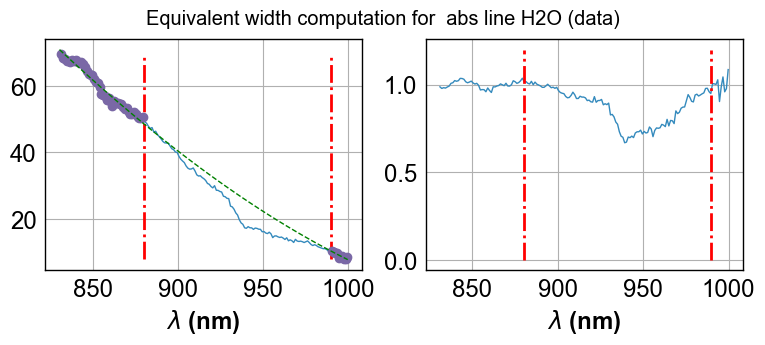

In [254]:
EQW_H2O_DATA = ShowEquivalentWidth2NonLinear(thewl,thespectrum,830,880,990,1000,' abs line H2O (data)')

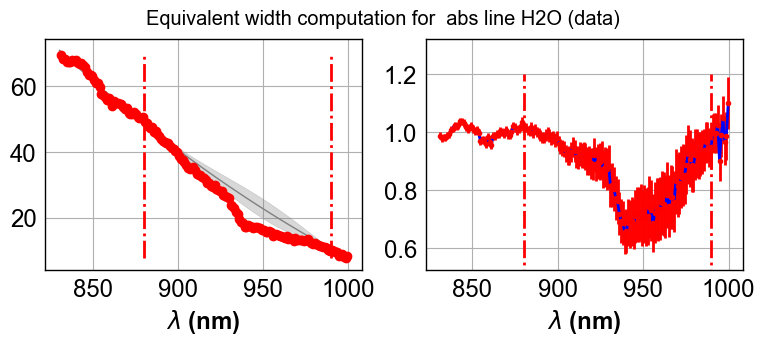

In [275]:
EQW_H2O_DATA = ShowEquivalentWidth2NonLinearwthStatErr(thewl,thespectrum,thespecstaterr,830,880,990,1000,' abs line H2O (data)')

In [ ]:
#EQW_H2O_SIM = ShowEquivalentWidth2(thewl,thesimspectrum,910,920,984,995,' abs line H2O (sim)')

In [ ]:
#print EQW_H2O_SIM,' ' ,EQW_H2O_SIM

In [257]:
#EQW_H2O_DATA = ShowEquivalentWidth(thewl,thespectrum,810,850,980,1000)
WL1_H2O_DATA=830
WL2_H2O_DATA=880
WL3_H2O_DATA=990
WL4_H2O_DATA=1000

In [258]:
#EQW_H2O_SIM = ShowEquivalentWidth(thewl,thesimspectrum,910,920,984,995)
WL1_H2O_SIM=WL1_H2O_DATA
WL2_H2O_SIM=WL2_H2O_DATA
WL3_H2O_SIM=WL3_H2O_DATA
WL4_H2O_SIM=WL4_H2O_DATA

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/li

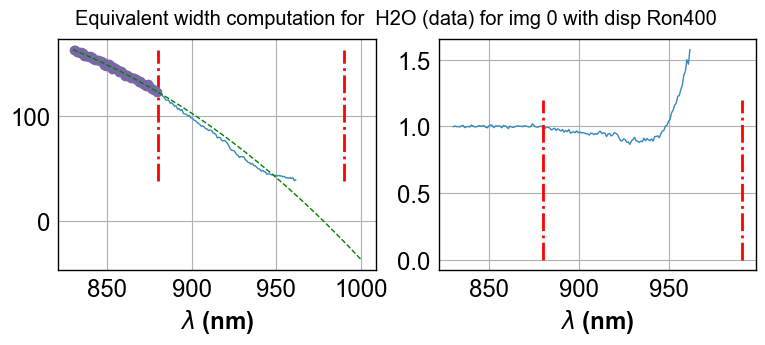

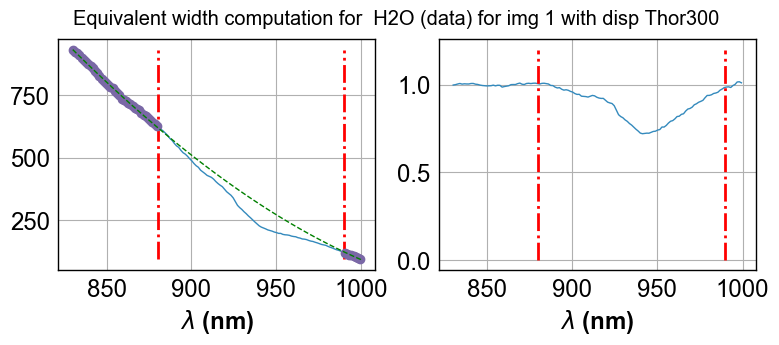

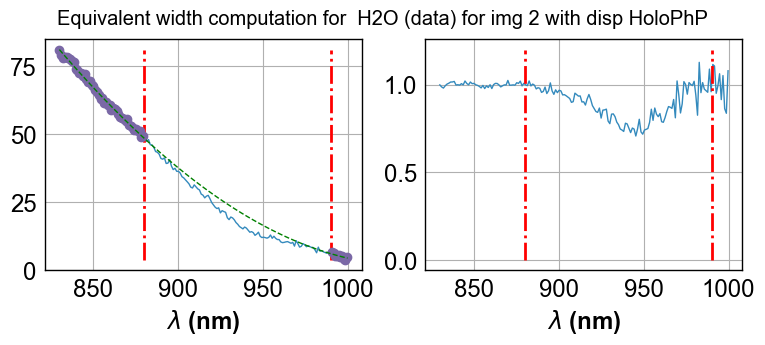

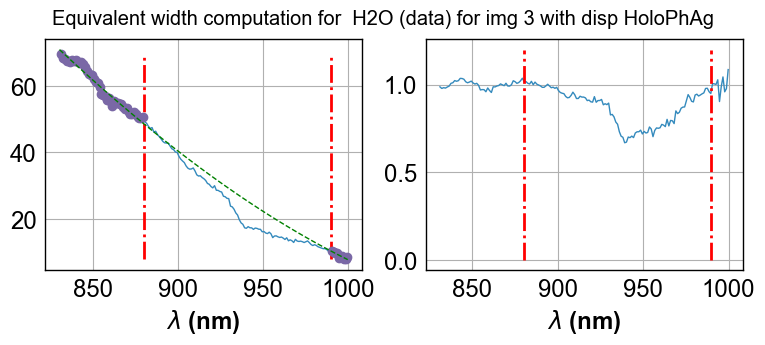

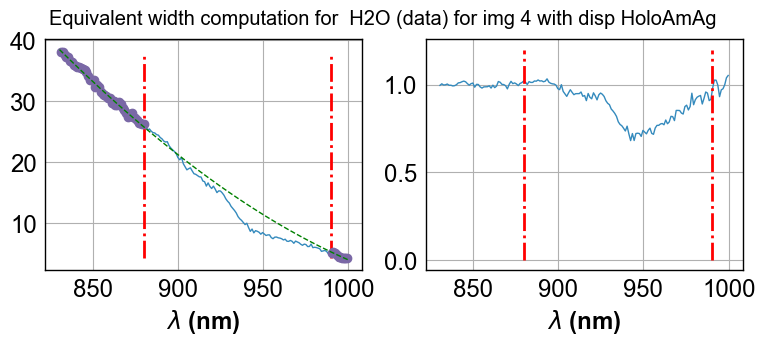

...

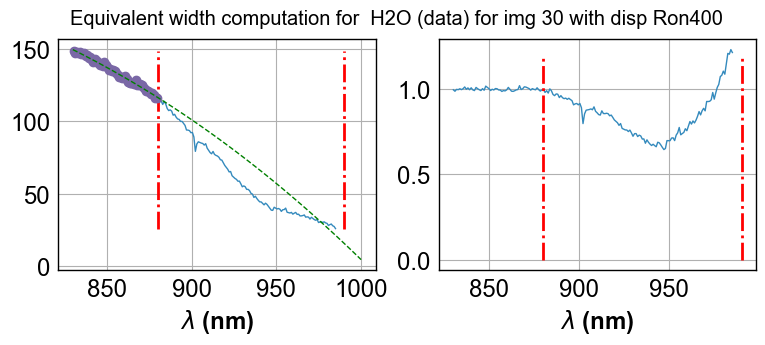

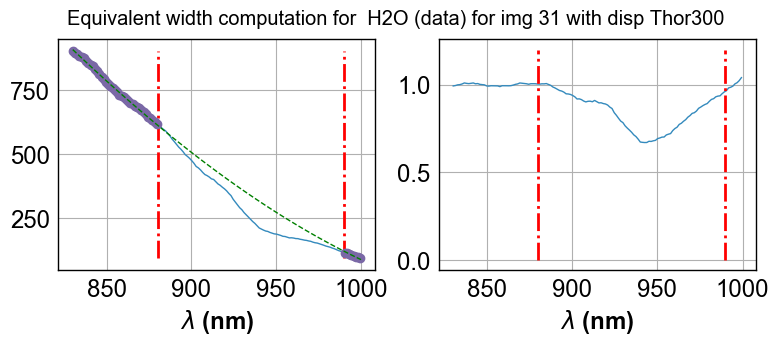

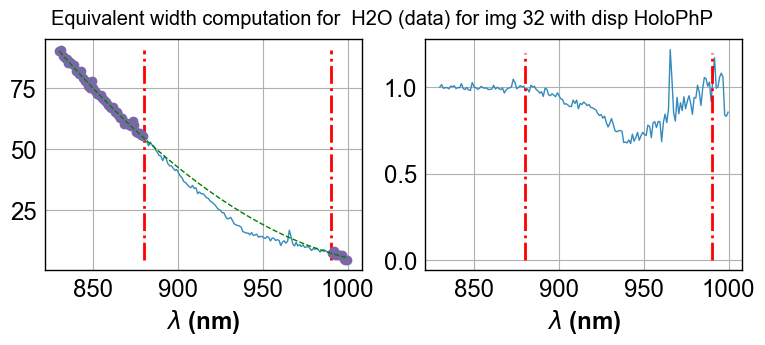

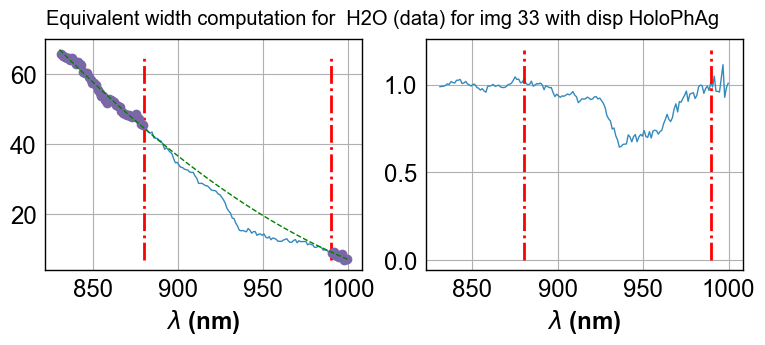

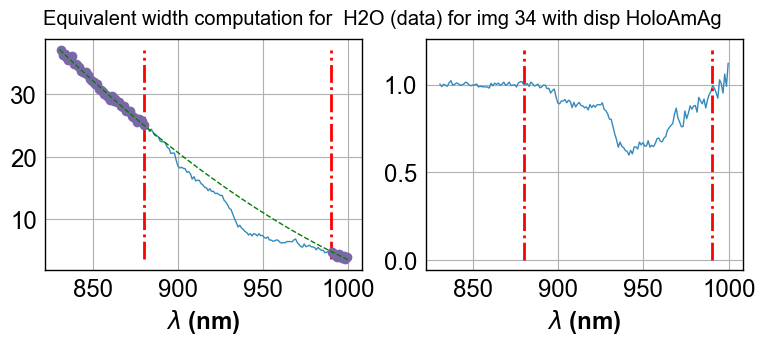

In [259]:
ShowAllEquivalentWidthNonLinear(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA,' H2O (data)')

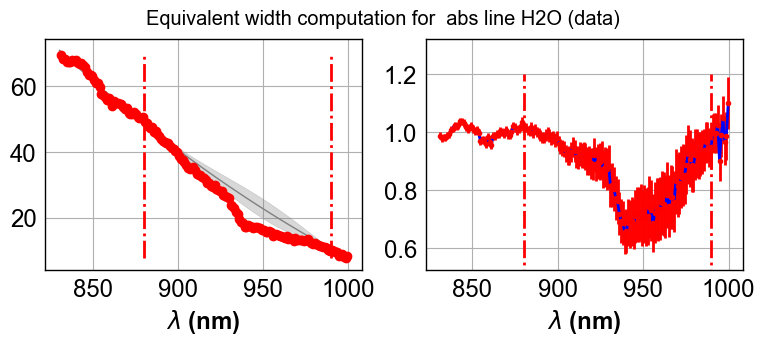

In [276]:
EQW_H2O_DATA = ShowEquivalentWidth2NonLinearwthStatErr(thewl,thespectrum,thespecstaterr,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA,' abs line H2O (data)')

In [ ]:
ShowAllEquivalentWidthNonLinear(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA,' H2O (data)')

-6.69966  nm 2827.70767154  nm
13.3039  nm 0.478032983918  nm
18.04  nm 0.236815797432  nm
14.0713  nm 0.409137340821  nm
12.5528  nm 0.136218600126  nm
-84.0664  nm 45369.0467092  nm
12.2467  nm 0.344931094797  nm
13.2285  nm 0.353588933241  nm
13.4503  nm 0.415837591798  nm
13.5241  nm 0.135145249415  nm
-79.1024  nm 141702.817104  nm
13.169  nm 0.440127239181  nm
14.8216  nm 0.29077290815  nm
15.5143  nm 0.332373375283  nm
15.2618  nm 0.13327024484  nm
-4.87227  nm 6915.71762602  nm
13.9974  nm 0.441190072027  nm
18.4562  nm 0.240527713343  nm
14.1695  nm 0.279064852527  nm
13.4772  nm 0.146937984321  nm
-16.3782  nm 1980.08588204  nm
13.7796  nm 0.425104672894  nm
12.6003  nm 0.305699475507  nm
19.8444  nm 0.356237695593  nm
12.1315  nm 0.152060259908  nm
-0.772021  nm 8581.98709422  nm
14.6735  nm 0.318748534294  nm
16.4559  nm 0.238843610674  nm
13.0494  nm 0.434496413007  nm
14.3247  nm 0.167758717752  nm
-16.6374  nm 4762.71427623  nm
14.7739  nm 0.566111353816  nm
24.6659  nm 

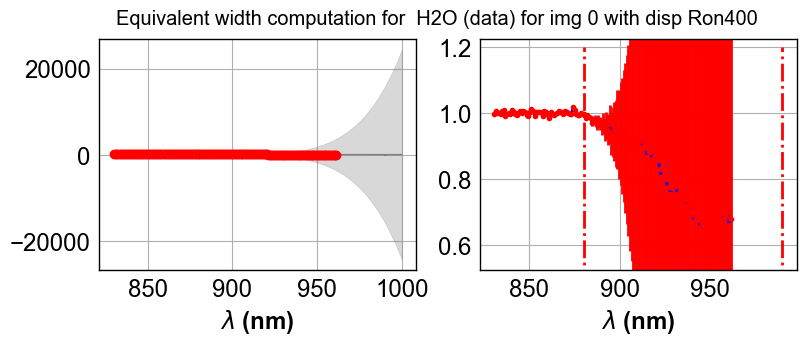

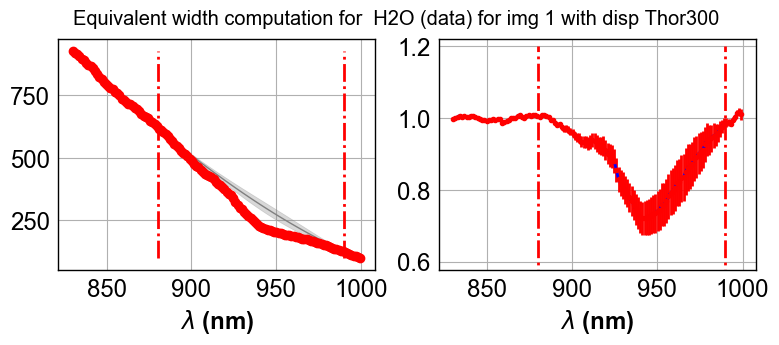

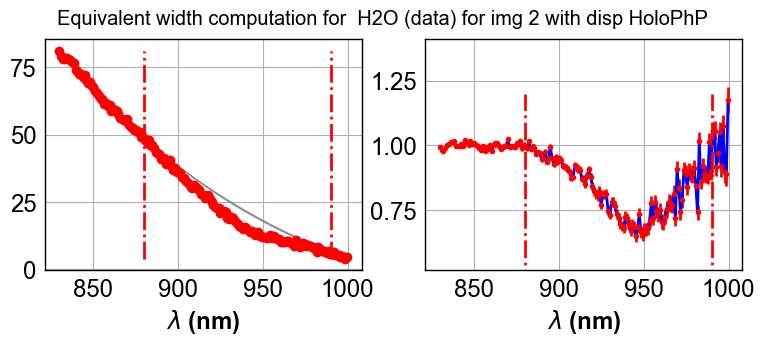

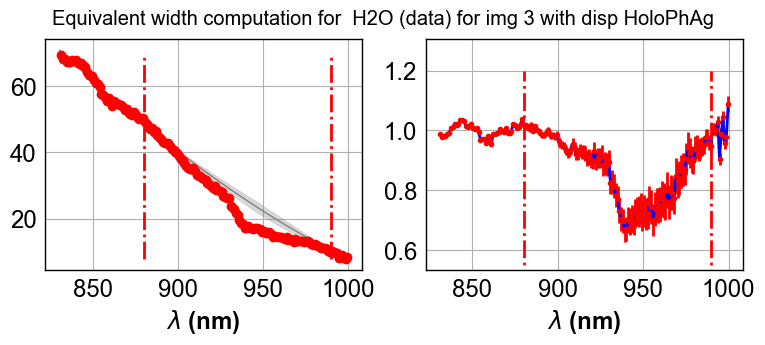

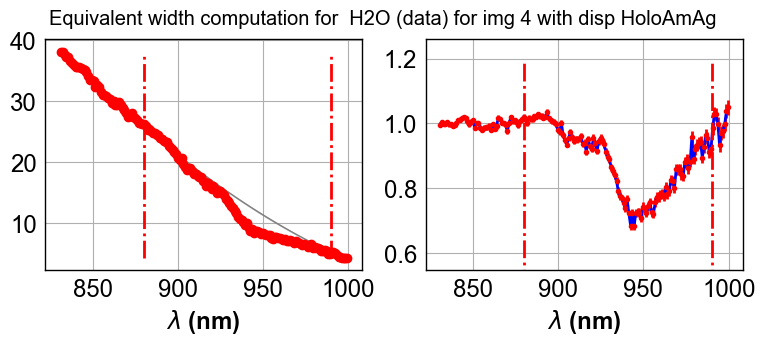

...

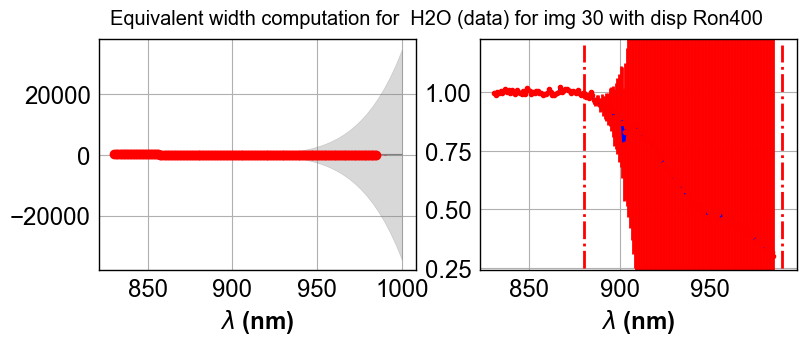

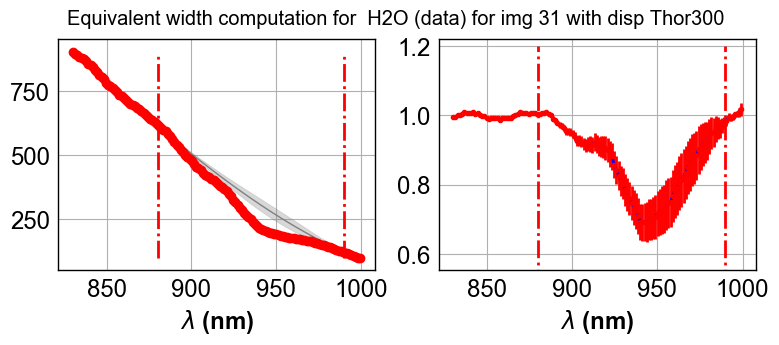

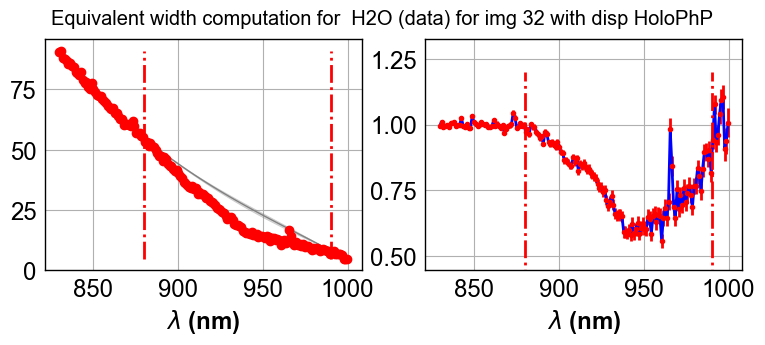

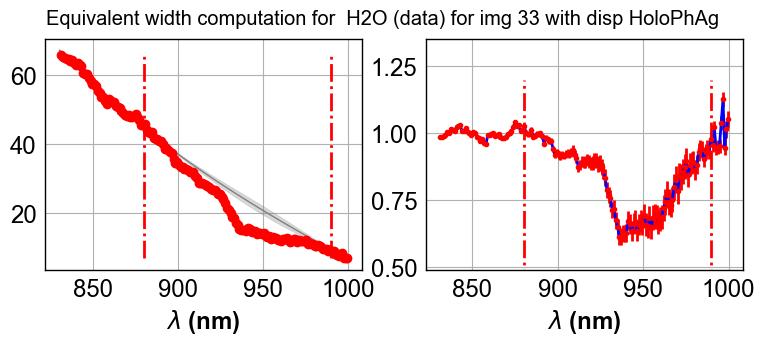

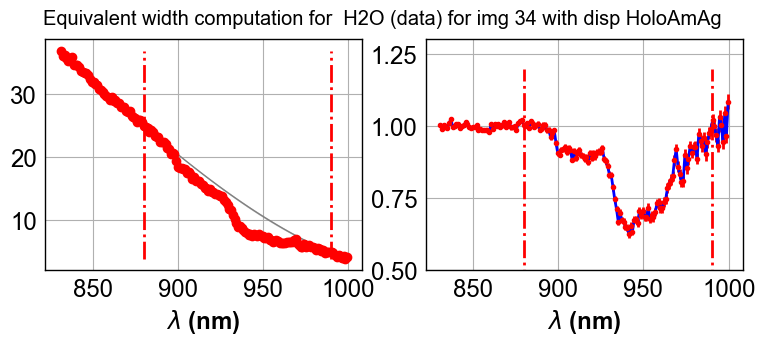

In [277]:
ShowAllEquivalentWidthNonLinearwthStatErr(all_rightspectra_wl,all_rightspectra_data,all_rightspectra_data_staterr,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA,' H2O (data)')

In [ ]:
ShowAllEquivalentWidthNonLinear(allwl_sim,allspectra_sim,WL1_H2O_SIM,WL2_H2O_SIM,WL3_H2O_SIM,WL4_H2O_SIM,' H2O (sim)')

In [ ]:
ShowAllEquivalentWidth(allwl_sim,allspectra_sim,WL1_H2O_SIM,WL2_H2O_SIM,WL3_H2O_SIM,WL4_H2O_SIM,' H2O (sim)')

In [ ]:
All_eqw_H2O_Data=ComputeAllEquivalentWidthNonLinear(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA)

In [ ]:
All_eqw_H2O_Sim=ComputeAllEquivalentWidthNonLinear(allwl_sim,allspectra_sim,WL1_H2O_SIM,WL2_H2O_SIM,WL3_H2O_SIM,WL4_H2O_SIM)

In [ ]:
All_eqw_H2O_Data=np.array(All_eqw_H2O_Data)
All_eqw_H2O_Sim=np.array(All_eqw_H2O_Sim)

In [ ]:
PlotEquivalentWidthVsAirMass(All_eqw_H2O_Data,All_eqw_H2O_Sim,am,'H2O abs line','eqwvsam_H2O.pdf')

In [ ]:
FitEquivalentWidthVsAirMass(All_eqw_H2O_Data,All_eqw_H2O_Sim,am,'H2O abs line','fiteqwvsam_H2O.pdf')

In [ ]:
PlotEquivalentWidthVsTime(All_eqw_H2O_Data,All_eqw_H2O_Sim,am,all_dt,'H2O abs line','eqwvstime_H20.pdf')

In [ ]:
plt.plot(am,all_hum,'o')

In [ ]:
X=All_eqw_H2O_Sim/All_eqw_O2_Sim

In [ ]:
plt.plot(all_hum,X,'o')

In [ ]:
print Thor300_index
print Ron400_index
print HoloPhP_index
print HoloPhAg_index
print HoloAmAg_index

In [ ]:
X_Thor=All_eqw_H2O_Sim[Thor300_index]/All_eqw_O2_Sim[Thor300_index]
Y_Thor=All_eqw_H2O_Data[Thor300_index]/All_eqw_O2_Data[Thor300_index]

In [ ]:
X_HoloPhP=All_eqw_H2O_Sim[HoloPhP_index]/All_eqw_O2_Sim[HoloPhP_index]
Y_HoloPhP=All_eqw_H2O_Data[HoloPhP_index]/All_eqw_O2_Data[HoloPhP_index]

In [ ]:
X_HoloPhAg=All_eqw_H2O_Sim[HoloPhAg_index]/All_eqw_O2_Sim[HoloPhAg_index]
Y_HoloPhAg=All_eqw_H2O_Data[HoloPhAg_index]/All_eqw_O2_Data[HoloPhAg_index]

In [ ]:
X_HoloAmAg=All_eqw_H2O_Sim[HoloAmAg_index]/All_eqw_O2_Sim[HoloAmAg_index]
Y_HoloAmAg=All_eqw_H2O_Data[HoloAmAg_index]/All_eqw_O2_Data[HoloAmAg_index]

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(X_Thor,Y_Thor,'bo',label='Thor 300')
plt.plot(X_HoloPhP,Y_HoloPhP,'go',label='HoloPhP')
plt.plot(X_HoloPhAg,Y_HoloPhAg,'o',color="cyan",label='HoloPhAg')
plt.plot(X_HoloAmAg,Y_HoloAmAg,'o',color="magenta",label='HoloAmAg')
plt.xlabel('EQW(H2O)/EQW(O2) in sim')
plt.ylabel('EQW(H2O)/EQW(O2) in data')
plt.legend()

## Save pandas file

In [ ]:
df=pd.DataFrame()

In [ ]:
df["airmass"]=all_airmass
df["time"]=all_dates
df["disperser"]=all_filt
df["humidity"]=all_hum
df["EQW_O2_DATA"]= All_eqw_O2_Data
df["EQW_H2O_DATA"]= All_eqw_H2O_Data
df["EQW_O2_SIM"]= All_eqw_O2_Sim
df["EQW_H2O_SIM"]= All_eqw_H2O_Sim

In [ ]:
df

In [ ]:
fulloutput=os.path.join(outputdir,output_file)

In [ ]:
fulloutput

In [ ]:
df.to_csv(fulloutput)